# **Telco Customer Churn**

**Abstract:**
This dataset is about Customer churn as when customers or subscribers discontinue doing business with a firm or service.

Each row represents a customer, each column contains customer’s attributes.

The data set includes information about:

**Customers who left within the last month** – the column is called Churn
Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and streaming TV and movies

**Customer account information** – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges
Demographic info about customers – gender, age range, and if they have partners and dependents

**Aim:**
In this assignment we aim to interpret the results of

* Linear Model
* Tree Based Model
* Best model of AutoML H2O

Using different Model Interpretibility Methods.


In [1]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o

import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# load the data
data_telco = pd.read_csv("https://raw.githubusercontent.com/AnusreeMyneni/002709300_Anusree-Myneni_Auto-ML/main/telco-customer-churn.csv")
data_telco.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [4]:
# creating a copy for further use
data_random = data_telco.copy()

In [5]:
#summary of the dataset
data_telco.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [6]:
# Checking if any missings values exists in the dataset
data_telco.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [7]:
# Checking any empty cells exists in the dataset
len(data_telco.loc[data_telco["TotalCharges"]==" "])

11

In [8]:
# Finding the empty rows in the dataset in specific column 
data_telco.loc[data_telco["TotalCharges"]==" "]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


In [9]:
# Converting "TotalCharges" to a numerical data type
data_telco['TotalCharges'] = pd.to_numeric(data_telco['TotalCharges'], errors='coerce')

In [10]:
# Replaced with NaN values and displaying the updated rows
data_telco[data_telco['TotalCharges'].isnull()]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


In [11]:
data_telco.dropna(inplace=True)

<Axes: >

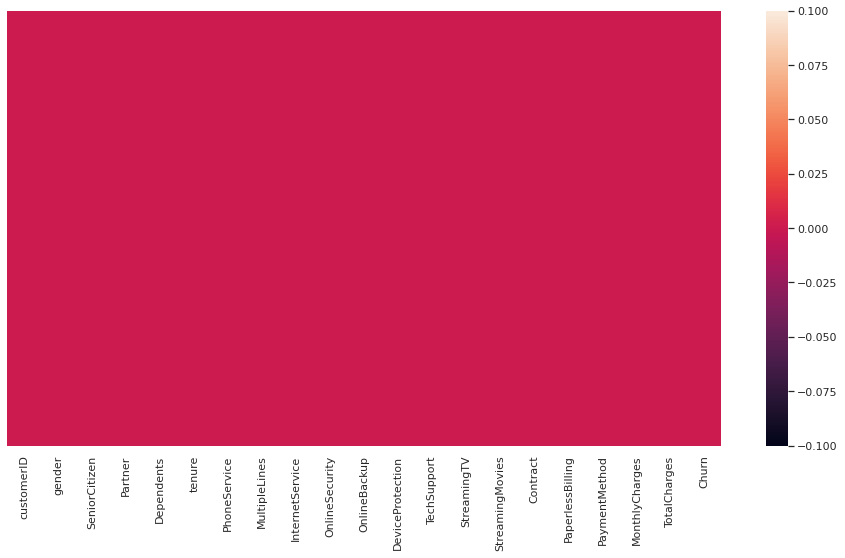

In [12]:
# Visualizing through heatmap whether any missing values available in the dataset
sns.heatmap(data_telco.isnull(),yticklabels=False)

In [13]:
#Remove customer IDs column from the data set
data_telco.drop("customerID",inplace=True,axis=1)

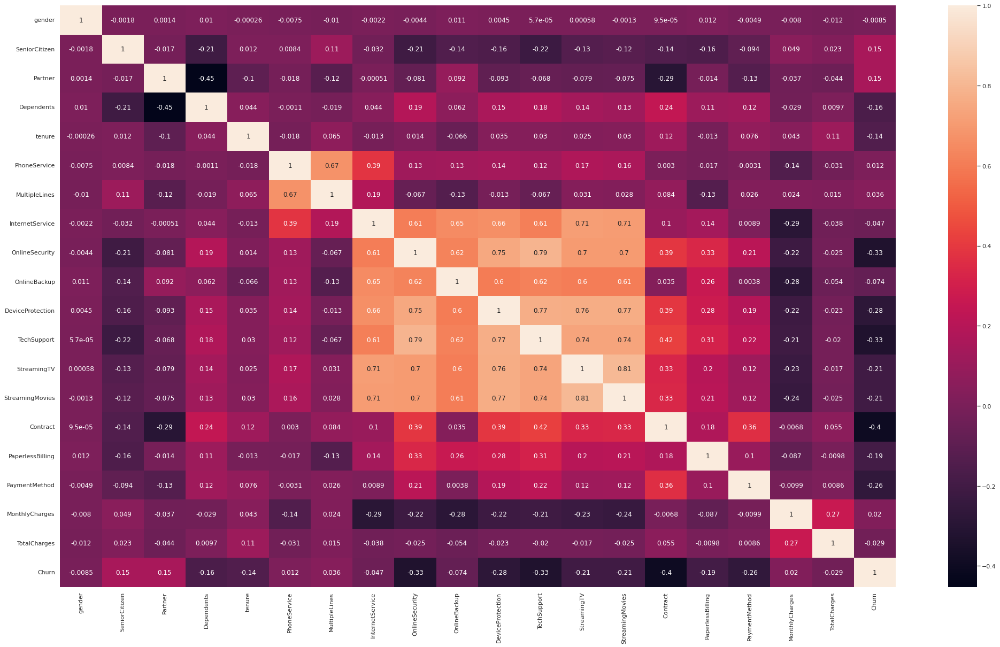

In [14]:
# plot the correlation
plt.figure(figsize=(35, 20))

corr_plot = data_telco.apply(lambda z: pd.factorize(z)[0]).corr()

p = sns.heatmap(corr_plot, xticklabels=corr_plot.columns, yticklabels=corr_plot.columns, annot=True)

In [15]:
# Import label encoder
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
label_encoder_ols = preprocessing.LabelEncoder()

In [16]:
data_telco_transformed = data_telco

# label encoding (binary variables)
label_encoding_columns = ['gender', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling','Churn']

# Transforming Categorical Columns
data_telco_transformed[label_encoding_columns] = data_telco_transformed[label_encoding_columns].apply(label_encoder.fit_transform)

In [17]:
one_hot_encoding_columns = ['MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 
                            'TechSupport', 'StreamingTV',  'StreamingMovies', 'Contract', 'PaymentMethod']

# encode categorical variables with more than two levels using one-hot encoding
data_telco_transformed = pd.get_dummies(data_telco_transformed, columns = one_hot_encoding_columns,drop_first=True)

In [18]:
scaler = MinMaxScaler()

min_max_columns = ['tenure', 'MonthlyCharges', 'TotalCharges']

# Encode numeric Columns
data_telco_transformed[min_max_columns] = scaler.fit_transform(data_telco_transformed[min_max_columns])

In [19]:
data_telco_transformed.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,...,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,0.000000,0,1,0.115423,0.001275,0,...,0,0,0,0,0,0,0,0,1,0
1,1,0,0,0,0.464789,1,0,0.385075,0.215867,0,...,0,0,0,0,0,1,0,0,0,1
2,1,0,0,0,0.014085,1,1,0.354229,0.010310,1,...,0,0,0,0,0,0,0,0,0,1
3,1,0,0,0,0.619718,0,0,0.239303,0.210241,0,...,1,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0.014085,1,1,0.521891,0.015330,1,...,0,0,0,0,0,0,0,0,1,0


In [20]:
data_telco_transformed_ols = data_telco

# label encoding (binary variables) for ols model
label_encoding_columns_ols = ['gender', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling','Churn']

# Transforming Categorical Columns for ols model
data_telco_transformed_ols[label_encoding_columns_ols] = data_telco_transformed_ols[label_encoding_columns_ols].apply(label_encoder_ols.fit_transform)

In [21]:
one_hot_encoding_columns = ['MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 
                            'TechSupport', 'StreamingTV',  'StreamingMovies', 'Contract', 'PaymentMethod']

# encode categorical variables with more than two levels using one-hot encoding
data_telco_transformed_ols = pd.get_dummies(data_telco_transformed_ols, columns = one_hot_encoding_columns,drop_first=True)

In [22]:
scaler_ols = MinMaxScaler()

# min-max normalization (numeric variables)
min_max_columns_ols = ['tenure', 'MonthlyCharges', 'TotalCharges']

# Encode numeric Columns
data_telco_transformed_ols[min_max_columns] = scaler_ols.fit_transform(data_telco_transformed_ols[min_max_columns_ols])

In [23]:
import statsmodels.api as sm

#define response variable
y_ols = data_telco_transformed_ols['Churn']

#define predictor variables
x_ols = data_telco_transformed_ols[['tenure','MonthlyCharges', 'TotalCharges']]

#add constant to predictor variables
x_ols = sm.add_constant(x_ols)

#fit regression model
model = sm.OLS(y_ols, x_ols).fit()

#view summary of model fit
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  Churn   R-squared:                       0.225
Model:                            OLS   Adj. R-squared:                  0.224
Method:                 Least Squares   F-statistic:                     678.8
Date:                Sun, 26 Mar 2023   Prob (F-statistic):               0.00
Time:                        01:35:56   Log-Likelihood:                -3338.1
No. Observations:                7032   AIC:                             6684.
Df Residuals:                    7028   BIC:                             6712.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.1937      0.013     14.

In [24]:
import statsmodels.api as sm
model_ols = sm.OLS(data_telco_transformed_ols['Churn'], data_telco_transformed_ols[['tenure','MonthlyCharges', 'TotalCharges']
]).fit()
# Print out the statistics
model_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  Churn   R-squared (uncentered):                   0.414
Model:                            OLS   Adj. R-squared (uncentered):              0.413
Method:                 Least Squares   F-statistic:                              1652.
Date:                Sun, 26 Mar 2023   Prob (F-statistic):                        0.00
Time:                        01:35:56   Log-Likelihood:                         -3442.7
No. Observations:                7032   AIC:                                      6891.
Df Residuals:                    7029   BIC:                                      6912.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
tenure             0.1651      0.021      7.799      0.000       0.124       0.207
MonthlyCharges     1.0456      0.016     65.154      0.000       1.014       1.077
TotalCharges      -1.2062      0.040    -30.159      0.000      -1.285      -1.128
==============================================================================
Omnibus:                      471.125   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              570.477
Skew:                           0.696   Prob(JB):                    1.33e-124
Kurtosis:                       2.902   Cond. No.                         7.74
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Interpreting Regression Co-efficients**

**R-squared** measures the percentage of how much of the variance is described by the model.

Value for the R-squared for this model is 41.4 which is low and variance was high for the regression line.

**Adj. R-squared** measures the percentage of how much of the variance is described by the model with a penalization for more variables.

Value for Adj R-Squared is also 41.4 which means it does not add any weightage to the features if added into the dataset.

**F-statistic** measures how significant the fit is for the model
Prob(F-statistic) or P-value is the probability that a sample of the population would produce the above statistic.


**Model Co-efficients**

The positive or negative value of a co-eficient tells us if there is a positve or a negative correlationship between the target and predictors. A positive value indicates that the value of target increases if the value of co-efficient increases and vice-versa. Whereas the negative values indicates that the value of target increases if the value of co-efficient decreases and vice versa.

Value for the variable Monthly Charges is highest = 1.0456 and tenure with 0.1651

Here, MonthlyCharges and Tenure are the most important variables to predict target Churn


**P-Values**

If the p-value is 0.05 or lower, the result is significant, but if it is higher than 0.05, the result is non-significant

Here all the 3 variables are less than 0.05, hence these variables are significant variables and any change to this variables have significant impact on the target.

**Skew and Kurtosis**

Skewness tells us the amount and direction of skew and Kurtosis tells us how tall and sharp the peak is. The optimum value for these two measures is 0, Here we have a value for Skew and Kurtosis as 0.696, 2.902 respectively.

**Durbin-Watson**

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.

Value of 2 indicates that no auto correlation is detected
Value between 0 to 2 indicates that there is positive auto correlation detected
Value between 2 to 4 indicates that there is negatibe auto correlation detected
Our model has a DW score of 1.991 which is a positive auto-correlation in the residuals of regression.

**Jarque-Bera Test**

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 570.477 which again re-inforces the interpretation we got from Skew and Kurtosis.

Here we have only 3 varibles for OLS model as dataset is a classification data and all the varible values having binary values so we can't able to fit more features in the model.

In [25]:
# Check for duplicates
print(data_telco_transformed.duplicated().sum())

22


In [26]:
# Drop the duplicate data from the dataset
data_telco_transformed.drop_duplicates(inplace=True)

In [27]:
# Check for duplicates
print(data_telco_transformed.duplicated().sum())

0


<Axes: xlabel='TotalCharges'>

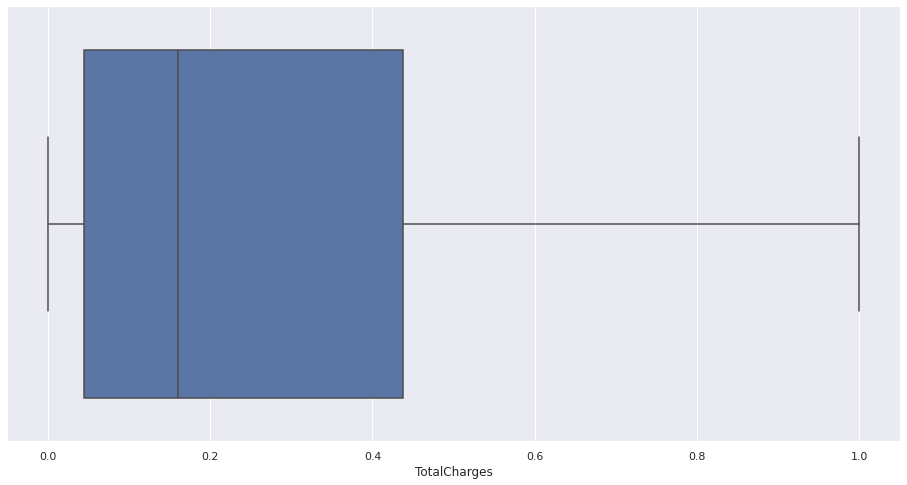

In [28]:
# Removing the extreme outliers for the column TotalCharges

Q1 = data_telco_transformed['TotalCharges'].quantile(0.25)
Q3 = data_telco_transformed['TotalCharges'].quantile(0.75)
IQR = Q3 - Q1

# Remove any observations that are more than 1.5 IQRs away from the median
df = data_telco_transformed[(data_telco_transformed['TotalCharges'] > Q1 - 1.5*IQR) & (data_telco_transformed['TotalCharges'] < Q3 + 1.5*IQR)]

sns.boxplot(x='TotalCharges', data=data_telco_transformed) 

<Axes: xlabel='MonthlyCharges'>

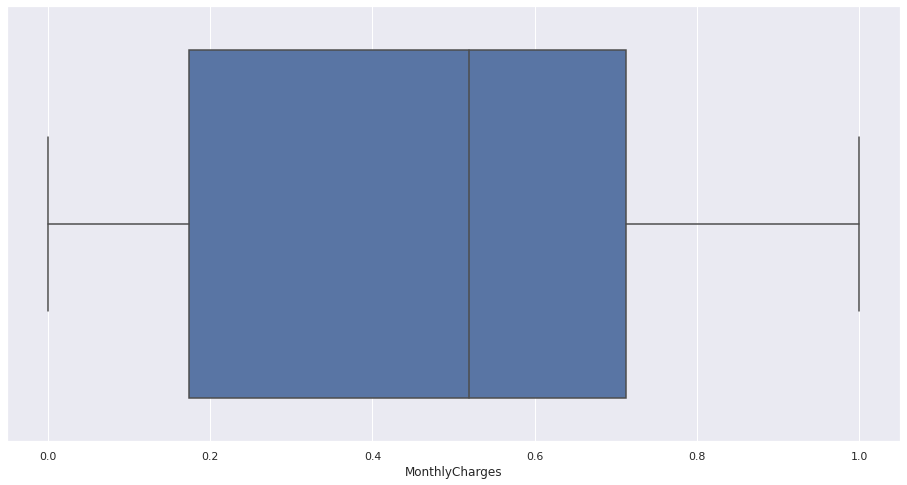

In [29]:
#removing the extreme outliers for the column MonthlyCharges

Q1 = data_telco_transformed['MonthlyCharges'].quantile(0.25)
Q3 = data_telco_transformed['MonthlyCharges'].quantile(0.75)
IQR = Q3 - Q1

# Remove any observations that are more than 1.5 IQRs away from the median
df = data_telco_transformed[(data_telco_transformed['MonthlyCharges'] > Q1 - 1.5*IQR) & (data_telco_transformed['MonthlyCharges'] < Q3 + 1.5*IQR)]

sns.boxplot(x='MonthlyCharges', data=data_telco_transformed) 

<Axes: xlabel='tenure'>

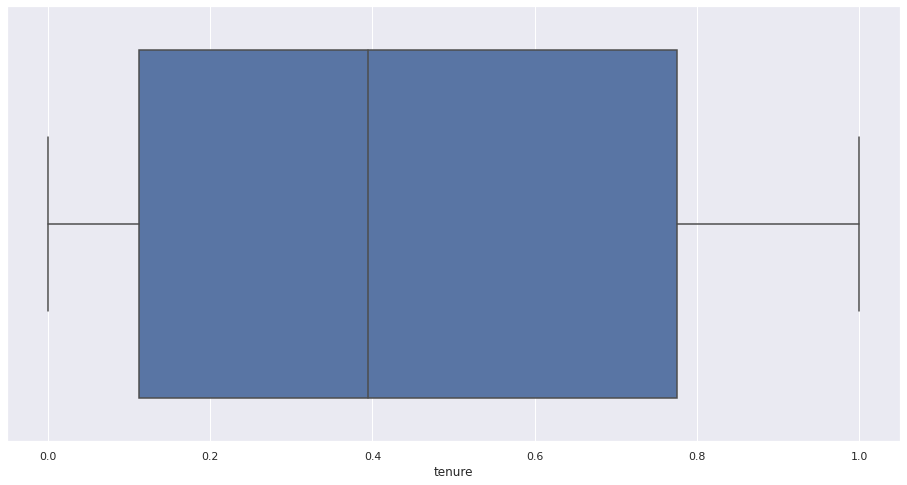

In [30]:
#removing the extreme outliers for the column Tenure

Q1 = data_telco_transformed['tenure'].quantile(0.25)
Q3 = data_telco_transformed['tenure'].quantile(0.75)
IQR = Q3 - Q1

# Remove any observations that are more than 1.5 IQRs away from the median
df = data_telco_transformed[(data_telco_transformed['tenure'] > Q1 - 1.5*IQR) & (data_telco_transformed['tenure'] < Q3 + 1.5*IQR)]

sns.boxplot(x='tenure', data=data_telco_transformed) 

In [31]:
# Define the feature variable 'X' and the label/target variable 'y'
X = data_telco_transformed.drop('Churn', axis=1)  # Drop the target variable
y = data_telco_transformed['Churn']

In [32]:
# Split the data into training and test datasets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=33)

In [34]:
from sklearn.ensemble import RandomForestClassifier
model_rf = RandomForestClassifier(n_estimators=1000 , oob_score = True, n_jobs = -1,
                                  random_state =50, max_features = "auto",
                                  max_leaf_nodes = 30)
model_rf.fit(X_train, y_train)

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


RandomForestClassifier(max_features='auto', max_leaf_nodes=30,
                       n_estimators=1000, n_jobs=-1, oob_score=True,
                       random_state=50)

In [35]:
# Make predictions
prediction_test_rf = model_rf.predict(X_test)
print (metrics.accuracy_score(y_test, prediction_test_rf))

0.7941036614360437


In [36]:
# evaluation
from sklearn.metrics import classification_report 
print(classification_report(y_test, prediction_test_rf))

              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1554
           1       0.64      0.48      0.55       549

    accuracy                           0.79      2103
   macro avg       0.74      0.69      0.71      2103
weighted avg       0.78      0.79      0.78      2103



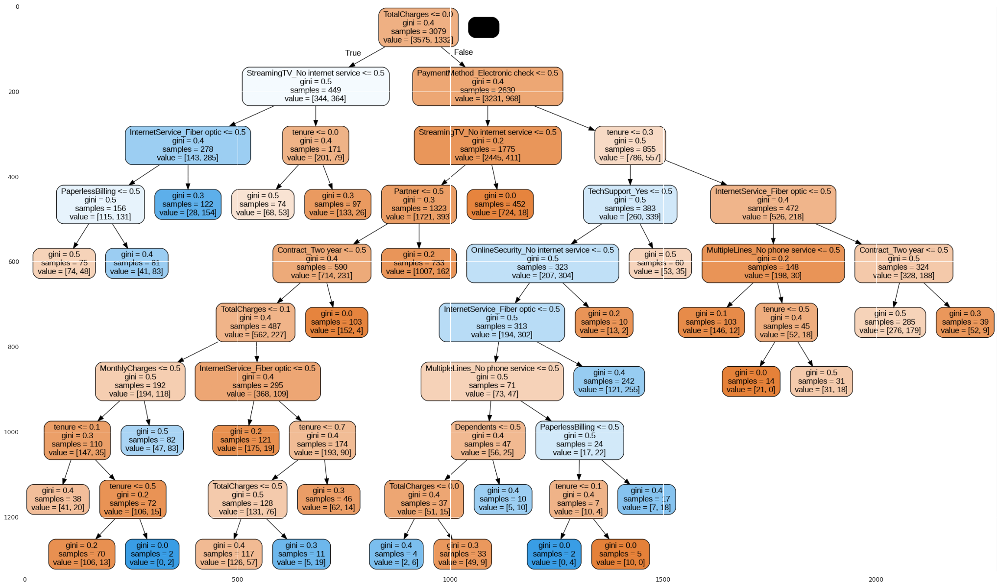

In [38]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree_model = model_rf.estimators_[0]
export_graphviz(
    tree_model,
    out_file="tree.dot",
    feature_names=list(X_train.columns),
    rounded=True,
    precision=1,filled=True
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

As we can see that, this tree is traversing each class in each node and helps to get insight and predicts a value.

Each square represents a node in the tree, with multiple leaf nodes in the graph. The root and interior nodes show the decision rule, used to split incoming data, at the top of the square. Each square also includes the: 

* Gini Impurity
* Total number of samples
* Number of samples per class
* Dominant class for the subset of training data at the node

In [39]:
# Initialising H2O Automl cluster (Locally)
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpuwlydzb4
  JVM stdout: /tmp/tmpuwlydzb4/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpuwlydzb4/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,16 days
H2O_cluster_name:,H2O_from_python_unknownUser_outruk
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [40]:
# Import dataset into H2O
hf = h2o.H2OFrame(data_telco_transformed)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [41]:
# Summary of the dataset in H2O
hf.describe(chunk_summary=True)

Rows:7010
Cols:31

Chunk compression summary: 
chunk_type    chunk_name       count    count_percentage    size      size_percentage
------------  ---------------  -------  ------------------  --------  -----------------
CBS           Binary           27       87.0968             25.0 KB   16.6062
CXI           Sparse Integers  1        3.22581             1.4 KB    0.932631
CUD           Unique Reals     1        3.22581             14.3 KB   9.52894
C8D           64-bit Reals     2        6.45161             109.7 KB  72.9323

Frame distribution summary: 
                 size      number_of_rows    number_of_chunks_per_column    number_of_chunks
---------------  --------  ----------------  -----------------------------  ------------------
127.0.0.1:54321  150.4 KB  7010              1                              31
mean             150.4 KB  7010              1                              31
min              150.4 KB  7010              1                              31
max              150.4 KB  7010              1                              31
stddev           0  B      0                 0                              0
total            150.4 KB  7010              1                              31

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
type,int,int,int,int,real,int,int,real,real,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int
mins,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,0.5042796005706134,0.16276747503566333,0.48402282453637663,0.2994293865905849,0.44394928773783937,0.9029957203994294,0.5931526390870185,0.464066330260253,0.26212247726945764,0.26490727532097,0.09700427960057062,0.4232524964336662,0.44079885877318115,0.21483594864479316,0.21483594864479316,0.28744650499286734,0.21483594864479316,0.3459343794579173,0.21483594864479316,0.3449358059914408,0.21483594864479316,0.29101283880171186,0.21483594864479316,0.3855920114122682,0.21483594864479316,0.38958630527817406,0.2099857346647646,0.24037089871611983,0.21697574893009985,0.3365192582025678,0.22653352353780315
maxs,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
sigma,0.5000173505311578,0.369179721618969,0.4997803136080667,0.4580407819218768,0.34535832913933967,0.2959847069772193,0.4912809951734357,0.2991519271338049,0.2615763710763395,0.4413152998196357,0.2959847069772193,0.49410995613217396,0.49651827082646066,0.41073778767497404,0.41073778767497404,0.4526038381773964,0.41073778767497404,0.47570586128351194,0.41073778767497404,0.475381250773736,0.41073778767497404,0.4542618226487047,0.41073778767497404,0.48676956878043326,0.41073778767497404,0.48769123949769133,0.40732713424134437,0.4273391872363564,0.4122153723235152,0.47255253929794794,0.4186180657587452
zeros,3475,5869,3617,4911,591,680,2852,1,1,5153,6330,4043,3920,5504,5504,4995,5504,4585,5504,4592,5504,4970,5504,4307,5504,4279,5538,5325,5489,4651,5422
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.11542288557213932,0.001275098084468036,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,0.46478873239436624,1.0,0.0,0.3850746268656716,0.21586660512347103,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.01408450704225352,1.0,1.0,0.35422885572139307,0.010310408492960998,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [42]:
# Split the data to train test split with 80:20
train, test = hf.split_frame(ratios=[0.8], seed = 25)

In [43]:
X = hf.columns
print(X)

['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'Churn', 'MultipleLines_No phone service', 'MultipleLines_Yes', 'InternetService_Fiber optic', 'InternetService_No', 'OnlineSecurity_No internet service', 'OnlineSecurity_Yes', 'OnlineBackup_No internet service', 'OnlineBackup_Yes', 'DeviceProtection_No internet service', 'DeviceProtection_Yes', 'TechSupport_No internet service', 'TechSupport_Yes', 'StreamingTV_No internet service', 'StreamingTV_Yes', 'StreamingMovies_No internet service', 'StreamingMovies_Yes', 'Contract_One year', 'Contract_Two year', 'PaymentMethod_Credit card (automatic)', 'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check']


In [44]:
# Setting target and predictor variables
y = "Churn"

# Removing the result from predictors data
X.remove(y)  
print(X)

['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'MultipleLines_No phone service', 'MultipleLines_Yes', 'InternetService_Fiber optic', 'InternetService_No', 'OnlineSecurity_No internet service', 'OnlineSecurity_Yes', 'OnlineBackup_No internet service', 'OnlineBackup_Yes', 'DeviceProtection_No internet service', 'DeviceProtection_Yes', 'TechSupport_No internet service', 'TechSupport_Yes', 'StreamingTV_No internet service', 'StreamingTV_Yes', 'StreamingMovies_No internet service', 'StreamingMovies_Yes', 'Contract_One year', 'Contract_Two year', 'PaymentMethod_Credit card (automatic)', 'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check']


In [45]:
#
H2OAutoML(nfolds=5, max_runtime_secs=3600, max_models=None, stopping_metric='AUTO', stopping_tolerance=None, stopping_rounds=3, seed=None, project_name=None)

The max_models argument specifies the maximum number of models to build, and the seed argument sets the random seed for reproducibility. The X argument specifies the predictor variables, which are all columns in the dataset except for the target variable, and the y argument specifies the target variable.

In [46]:
# Stopping Criterias: max time and max number of models has been applied for the model deployment
# Run AutoML for 25 base models
aml = H2OAutoML(max_models = 25,  
                seed = 19, 
                project_name='classification')

%time aml.train(x = X, y = y, training_frame = train)

AutoML progress: |
01:37:06.990: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
01:37:19.718: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


01:37:24.9: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███
01:37:34.155: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


01:37:38.688: _response param, We have det

key,value
Stacking strategy,cross_validation
Number of base models (used / total),15/25
# GBM base models (used / total),4/9
# XGBoost base models (used / total),6/8
# DeepLearning base models (used / total),4/5
# GLM base models (used / total),1/1
# DRF base models (used / total),0/2
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [47]:
# Run AutoML for 25 base models
aml = H2OAutoML(max_models = 25,  
                seed = 96, 
                project_name='classification')

%time aml.train(x = X, y = y, training_frame = test)

AutoML progress: |
01:37:06.990: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
01:37:19.718: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
01:37:24.9: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
01:37:34.155: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
01:37:38.688: _response param, We have detected that yo

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_2_AutoML_2_20230326_14756_model_4


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    36                 36                          8902                   4            4            4             12            16            15.0833

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.10650263942951992
RMSE: 0.32634742136183625
MAE: 0.24288012623549274
RMSLE: 0.22914715779372058
Mean Residual Deviance: 0.10650263942951992

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.13174602788764073
RMSE: 0.3629683565927486
MAE: 0.26985432832751577
RMSLE: 0.2557019284756551
Mean Residual Deviance: 0.13174602788764073

Cross-Validation Metrics Summary: 
                        mean      sd          cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ----------  ------------  ------------  ------------  ------------  ------------
mae                     0.26766   0.00570942  0.272376      0.260983      0.262066      0.272804      0.27007
mean_residual_deviance  0.132632  0.00567073  0.135237      0.123934      0.129927      0.137312      0.13675
mse                     0.132632  0.00567073  0.135237      0.123934      0.129927      0.137312      0.13675
r2                      0.324335  0.0608432   0.323197      0.352717      0.401912      0.307201      0.236649
residual_deviance       0.132632  0.00567073  0.135237      0.123934      0.129927      0.137312      0.13675
rmse                    0.364119  0.00784423  0.367746      0.352042      0.360454      0.370556      0.369797
rmsle                   0.256706  0.00623872  0.258094      0.251734      0.249105      0.26021       0.264386

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-03-26 01:48:23  3.793 sec   0                  0.444928         0.395922        0.197961
    2023-03-26 01:48:23  3.806 sec   5                  0.399469         0.348647        0.159575
    2023-03-26 01:48:23  3.817 sec   10                 0.372438         0.315938        0.13871
    2023-03-26 01:48:23  3.827 sec   15                 0.353241         0.28726         0.124779
    2023-03-26 01:48:23  3.838 sec   20                 0.343504         0.269491        0.117995
    2023-03-26 01:48:23  3.850 sec   25                 0.338199         0.257568        0.114378
    2023-03-26 01:48:23  3.862 sec   30                 0.332806         0.250892        0.11076
    2023-03-26 01:48:23  3.873 sec   35                 0.327842         0.244002        0.10748
    2023-03-26 01:48:23  3.877 sec   36                 0.326347         0.24288         0.106503

Variable Importances: 
variable                               relative_importance    scaled_importance     percentage
-------------------------------------  ---------------------  --------------------  ---------------------
tenure                                 99.91573333740234      1.0                   0.18653466211065112
MonthlyCharges                         92.74713134765625      0.9282535217397778    0.1731514570307514
TotalCharges                           81.76826477050781      0.8183722626984791    0.1526547935031898
PaymentMethod_Electronic check         76.31621551513672      0.7638057887983152    0.1424762547316531
InternetService_Fiber optic            35.43973159790039      0.3546962066346955    0.06616313705653261
Contract_Two year                      28.45774269104004      0.284

In this model, the training-set accuracy score is 0.7865 while the test-set accuracy to be 0.8021. These two values are quite comparable. So, there is no sign of overfitting.

GBM is considered one of the best classification models because of its several advantages such as:

Performance: GBM is a highly optimized implementation of gradient boosting that provides fast training and prediction times.

Scalability: GBM can handle large datasets with a large number of features, making it suitable for big data problems.

Flexibility: GBM allows users to specify custom objective functions and evaluation metrics, and it provides a large number of hyperparameters that can be tuned to improve model performance.

Regularization: GBM includes built-in regularization through L1 and L2 regularization, which can help to prevent overfitting and improve generalization.

Interoperability: GBM integrates well with other machine learning libraries, including scikit-learn and TensorFlow, making it easy to use in a wide range of applications.

Interpretability: GBM provides feature importances, which can be used to understand the most important features in a model and make informed decisions about feature engineering.

Overall, GBM is a powerful and versatile machine learning algorithm that has been widely adopted in the data science community and is often the go-to algorithm for many classification problems.

## This will display the top models ranked by their performance metric.

In [48]:
# View the AutoML viewboard
ml_results = aml.leaderboard
ml_results.head(rows=ml_results.nrows)

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
GBM_grid_2_AutoML_2_20230326_14756_model_4,0.362968,0.131746,0.269854,0.255702,0.131746
GBM_6_AutoML_2_20230326_14756,0.363578,0.132189,0.272769,0.256058,0.132189
GBM_grid_2_AutoML_2_20230326_14756_model_1,0.365842,0.133841,0.267739,0.257452,0.133841
GBM_grid_2_AutoML_2_20230326_14756_model_3,0.367431,0.135006,0.267443,0.258641,0.135006
StackedEnsemble_AllModels_1_AutoML_1_20230326_13706,0.368237,0.135599,0.272966,0.258344,0.135599
StackedEnsemble_BestOfFamily_1_AutoML_1_20230326_13706,0.369127,0.136255,0.277204,0.25922,0.136255
GBM_1_AutoML_1_20230326_13706,0.369613,0.136614,0.276218,0.259384,0.136614
GBM_grid_1_AutoML_1_20230326_13706_model_2,0.369833,0.136776,0.274846,0.259503,0.136776
GBM_grid_2_AutoML_2_20230326_14756_model_2,0.369883,0.136814,0.273657,0.260811,0.136814
GLM_2_AutoML_2_20230326_14756,0.370785,0.137481,0.291904,0.264517,0.137481


In [49]:
# View the AutoML leaderboard with all possible columns
from h2o.automl import get_leaderboard
ml_result1 = get_leaderboard(aml, extra_columns='ALL')
ml_result1.head(rows=ml_result1.nrows)

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_grid_2_AutoML_2_20230326_14756_model_4,0.362968,0.131746,0.269854,0.255702,0.131746,87,0.012042,GBM
GBM_6_AutoML_2_20230326_14756,0.363578,0.132189,0.272769,0.256058,0.132189,245,0.007375,GBM
GBM_grid_2_AutoML_2_20230326_14756_model_1,0.365842,0.133841,0.267739,0.257452,0.133841,113,0.008158,GBM
GBM_grid_2_AutoML_2_20230326_14756_model_3,0.367431,0.135006,0.267443,0.258641,0.135006,143,0.007083,GBM
StackedEnsemble_AllModels_1_AutoML_1_20230326_13706,0.368237,0.135599,0.272966,0.258344,0.135599,1655,0.070635,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20230326_13706,0.369127,0.136255,0.277204,0.25922,0.136255,1323,0.016685,StackedEnsemble
GBM_1_AutoML_1_20230326_13706,0.369613,0.136614,0.276218,0.259384,0.136614,2295,0.007117,GBM
GBM_grid_1_AutoML_1_20230326_13706_model_2,0.369833,0.136776,0.274846,0.259503,0.136776,302,0.007067,GBM
GBM_grid_2_AutoML_2_20230326_14756_model_2,0.369883,0.136814,0.273657,0.260811,0.136814,187,0.007477,GBM
GLM_2_AutoML_2_20230326_14756,0.370785,0.137481,0.291904,0.264517,0.137481,26,0.004358,GLM


In [50]:
#Viw the model performance of the dataset in AutoML with the metric values
aml.leader.model_performance(test_data=test)

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.10650263974886333
RMSE: 0.3263474218511054
MAE: 0.24288012336711431
RMSLE: 0.22914715782693387
Mean Residual Deviance: 0.10650263974886333

In [51]:
# To generate predictions on a test set, you can make predictions
# directly on the `H2OAutoML` object or on the leader model
aml.predict

<bound method H2OAutoML.predict of <h2o.automl._estimator.H2OAutoML object at 0x7f718ca89f40>>

### **SHAP Explainability**

SHAP plot shows the contribution of the features for each instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model.

SHAP explaination shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_2_AutoML_2_20230326_14756_model_2,0.0557426,0.00310723,0.0359839,0.0415773,0.00310723,245,0.008623,XGBoost
XGBoost_5_AutoML_2_20230326_14756,0.14941,0.0223235,0.103794,0.109594,0.0223235,211,0.005042,XGBoost
DRF_2_AutoML_2_20230326_14756,0.150049,0.0225146,0.10019,0.107308,0.0225146,294,0.007728,DRF
XGBoost_grid_2_AutoML_2_20230326_14756_model_3,0.16625,0.0276392,0.110701,0.118768,0.0276392,166,0.00464,XGBoost
XGBoost_4_AutoML_2_20230326_14756,0.193166,0.0373132,0.134002,0.139852,0.0373132,249,0.004622,XGBoost
XGBoost_grid_2_AutoML_2_20230326_14756_model_1,0.197305,0.0389294,0.134374,0.140108,0.0389294,230,0.004782,XGBoost
DeepLearning_grid_4_AutoML_2_20230326_14756_model_2,0.217839,0.0474538,0.142579,0.154069,0.0474538,19874,0.006948,DeepLearning
XGBoost_grid_2_AutoML_2_20230326_14756_model_4,0.254856,0.0649517,0.177947,0.179993,0.0649517,97,0.00292,XGBoost
XGBoost_grid_2_AutoML_2_20230326_14756_model_5,0.255078,0.0650648,0.181857,0.181392,0.0650648,128,0.005914,XGBoost
XGBoost_6_AutoML_2_20230326_14756,0.256408,0.0657451,0.177479,0.180707,0.0657451,126,0.002795,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

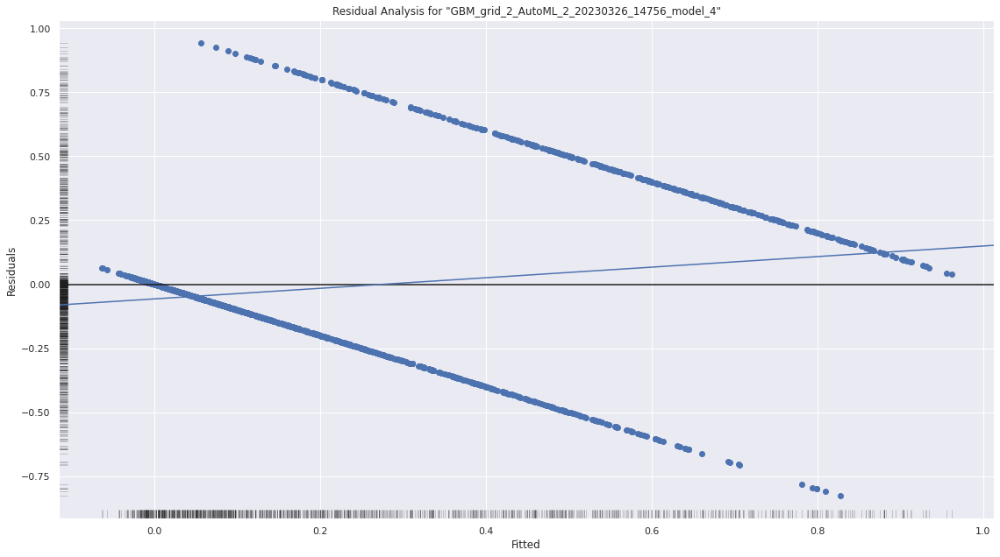

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

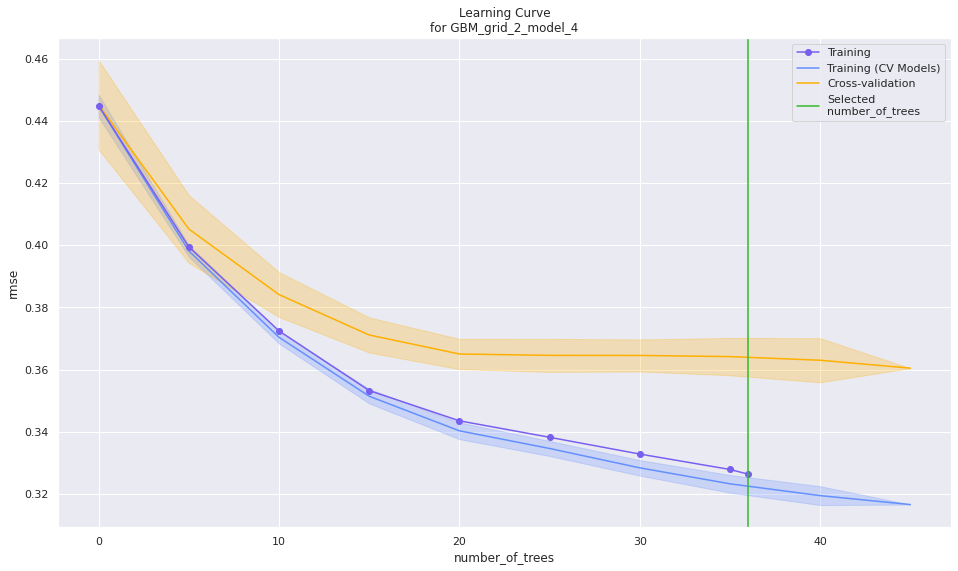

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

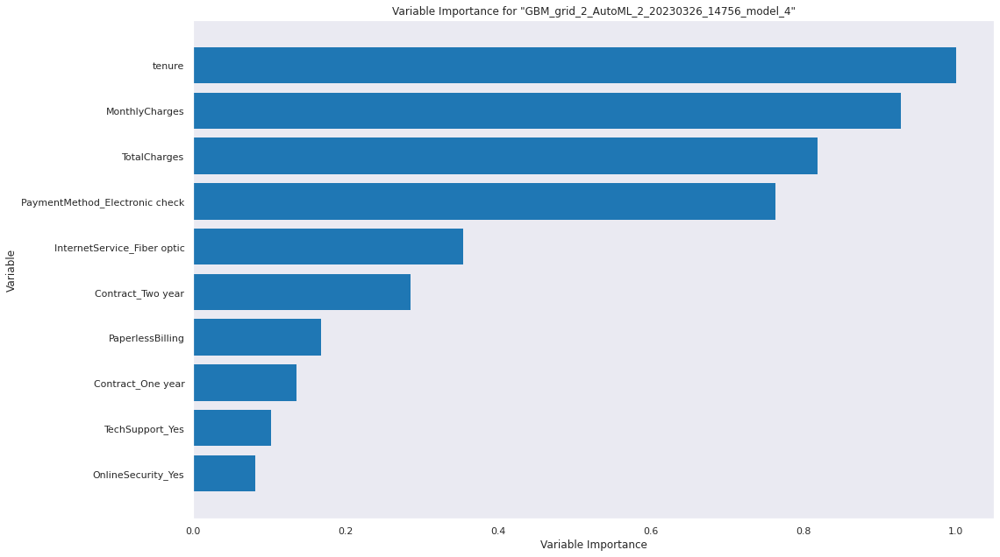

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

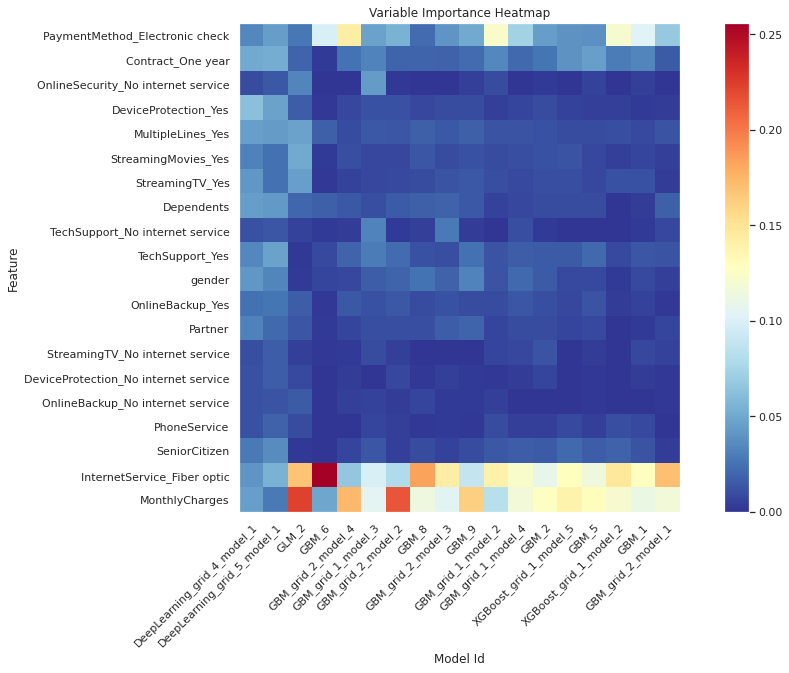

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

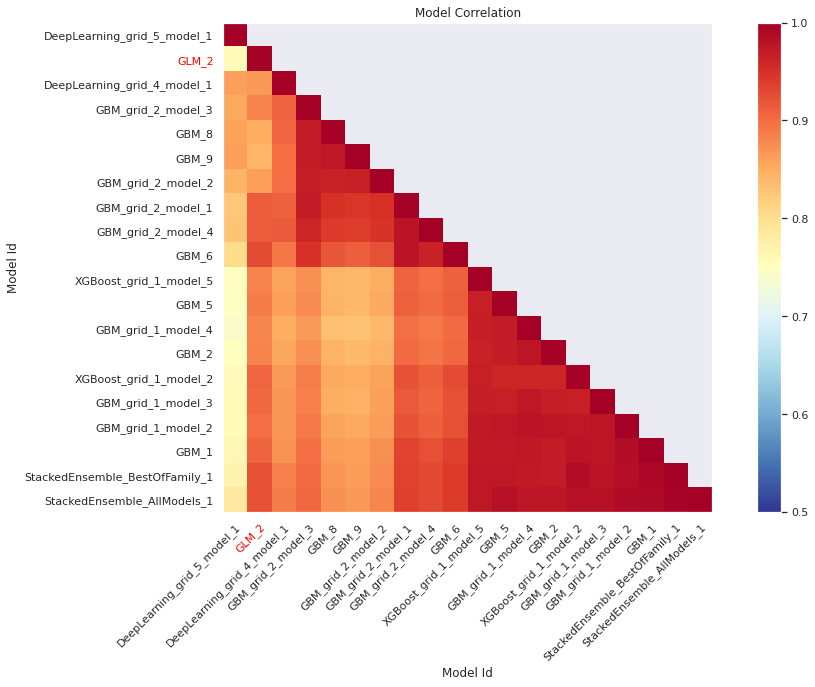

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

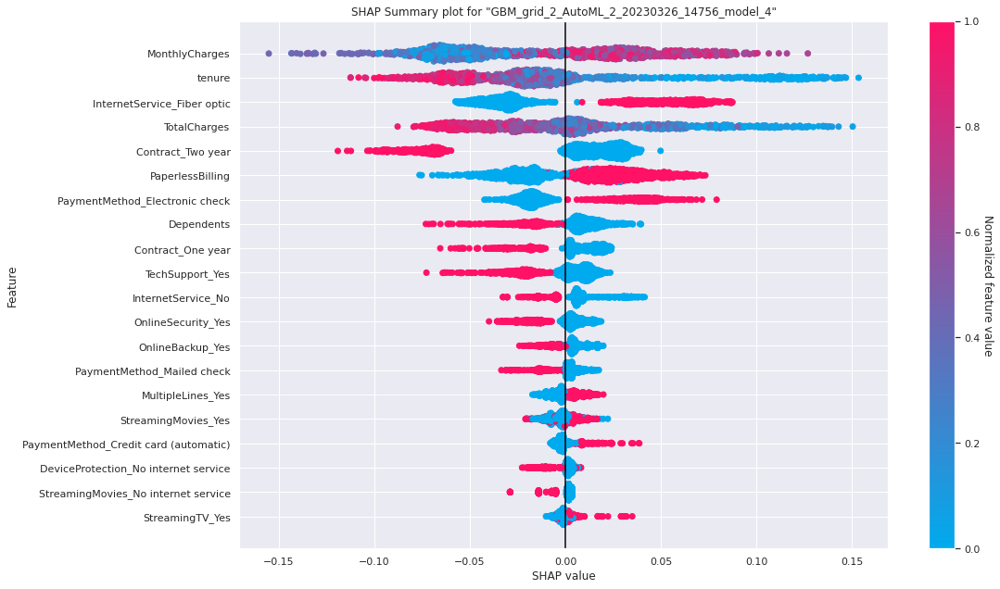

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

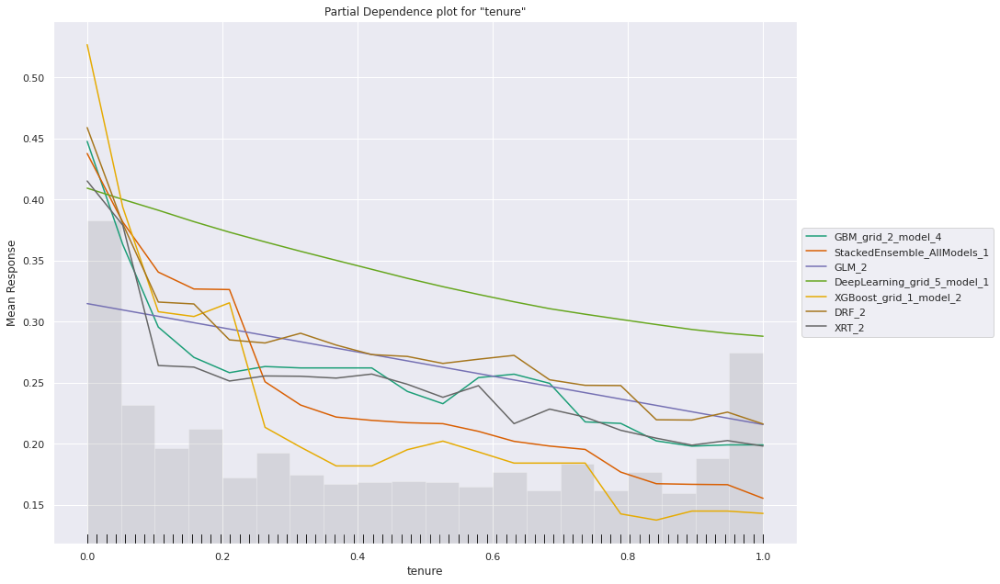

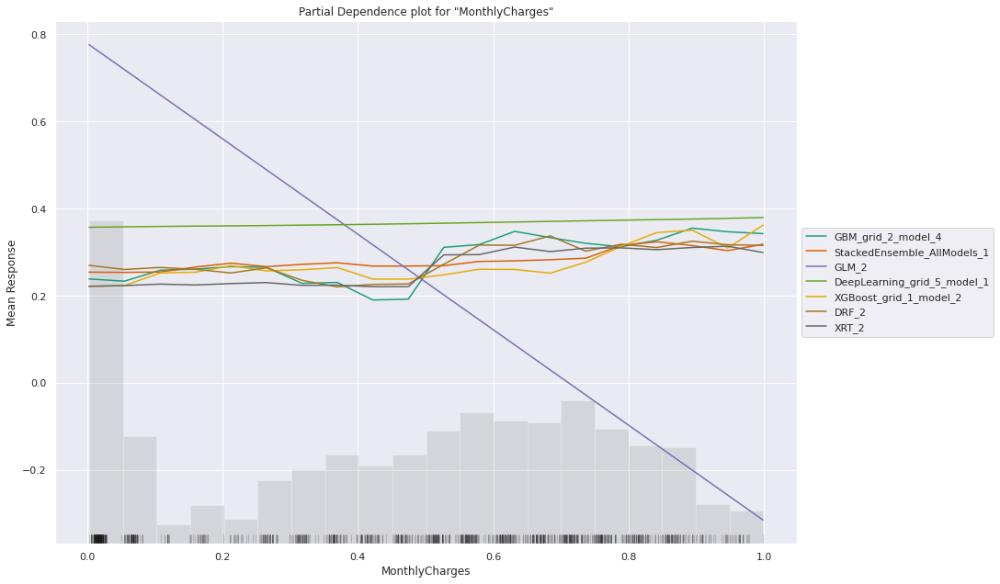

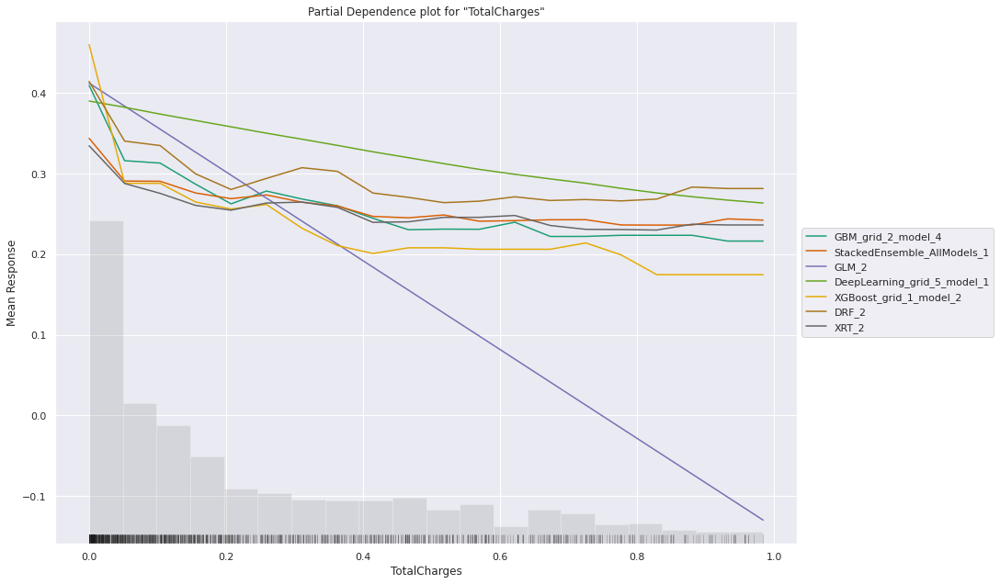

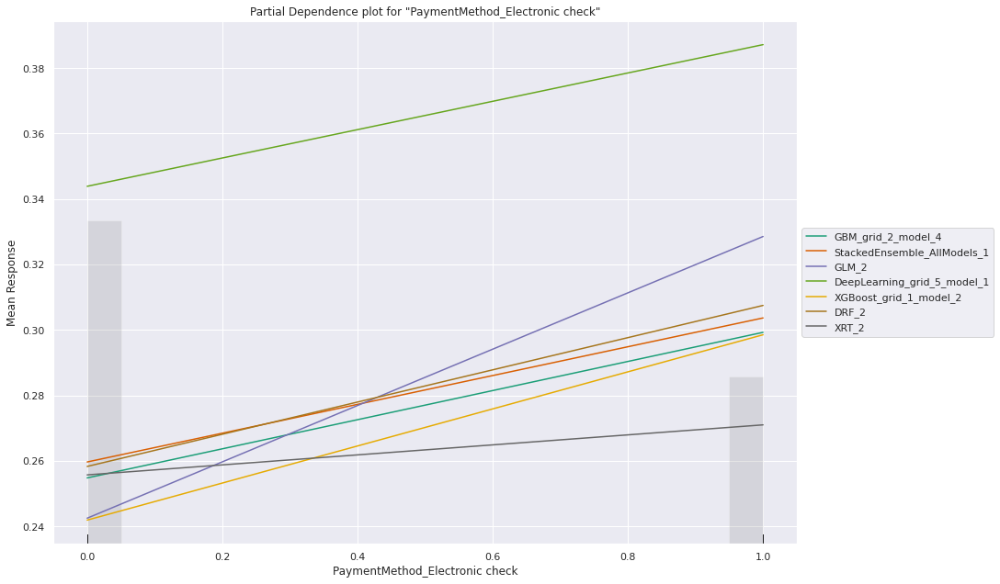

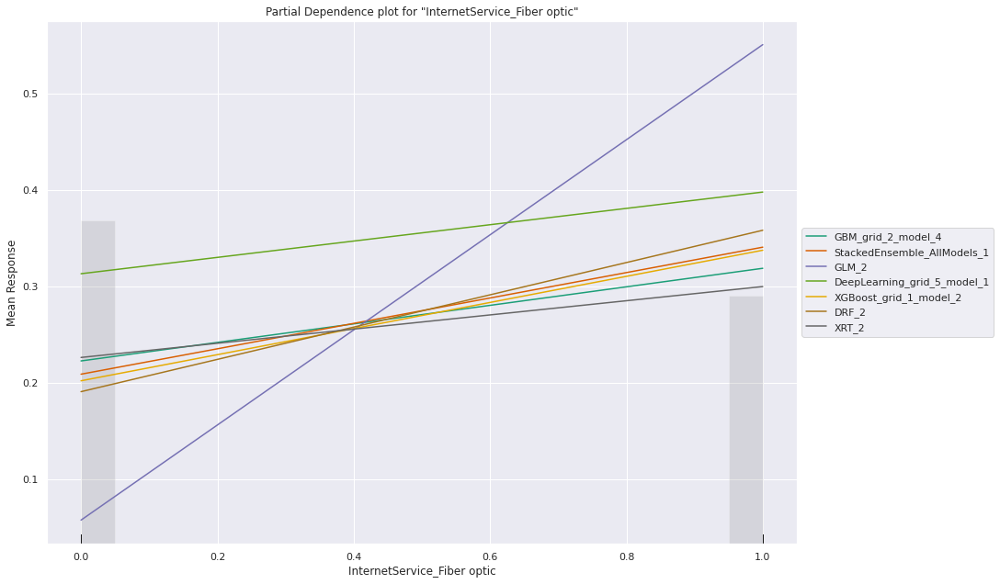

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

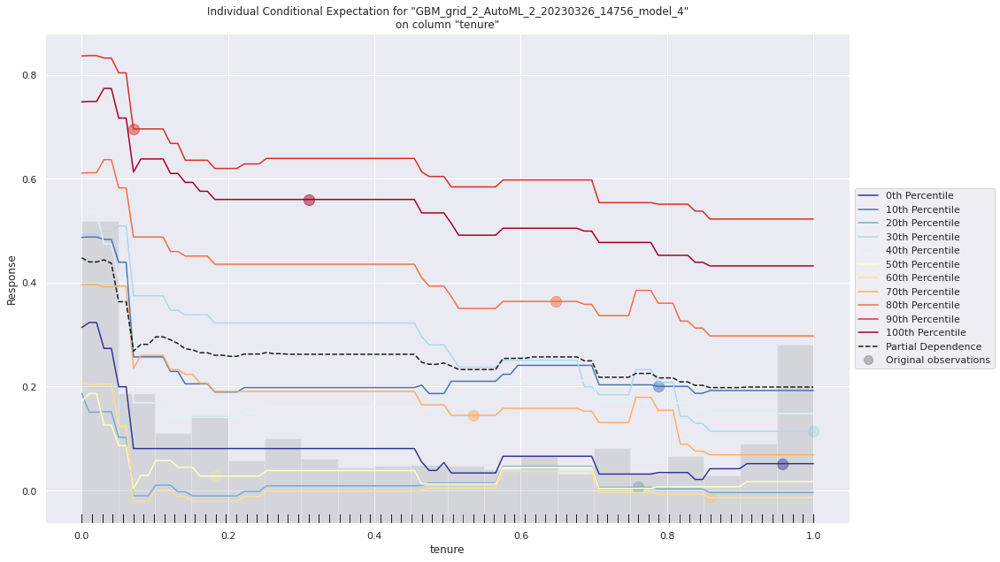

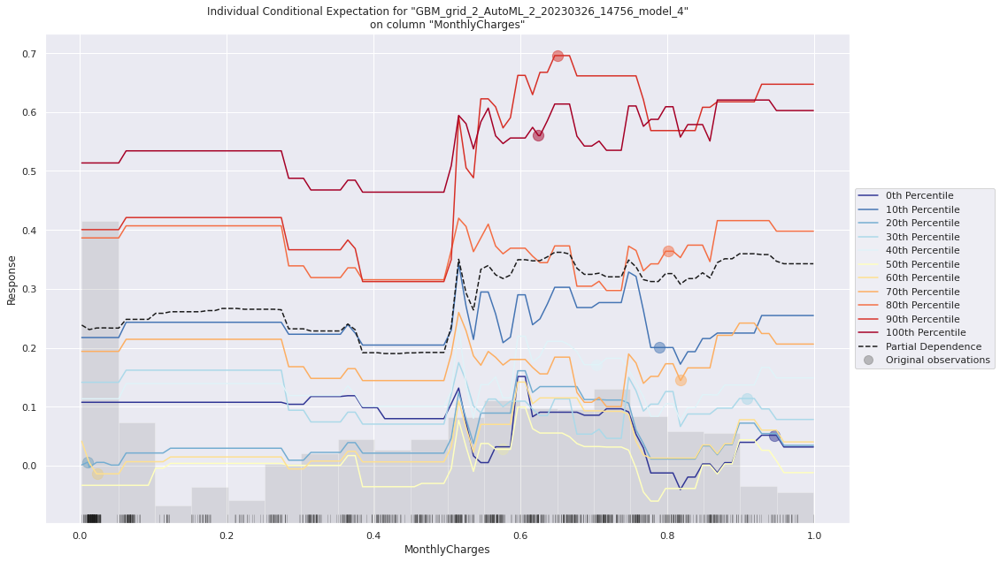

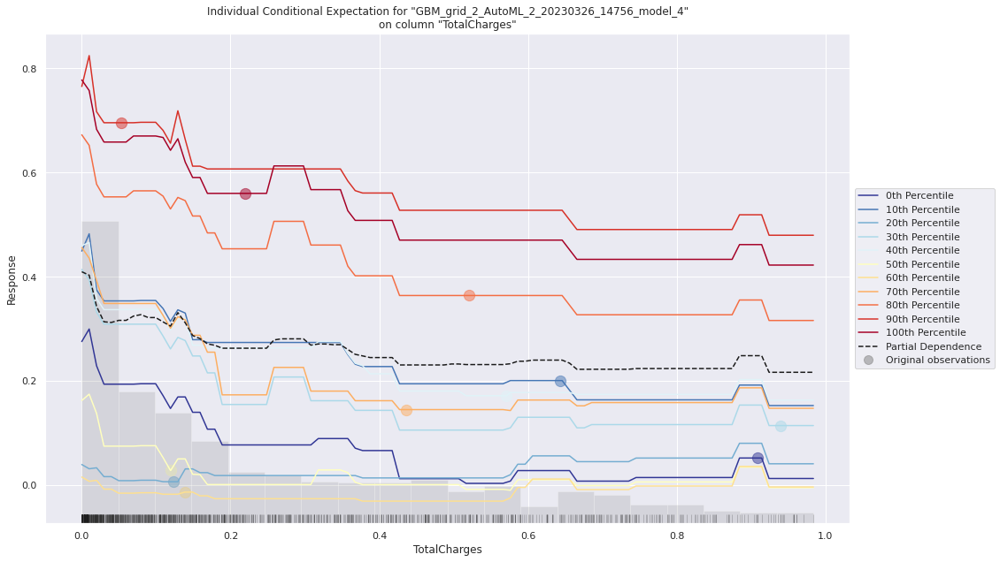

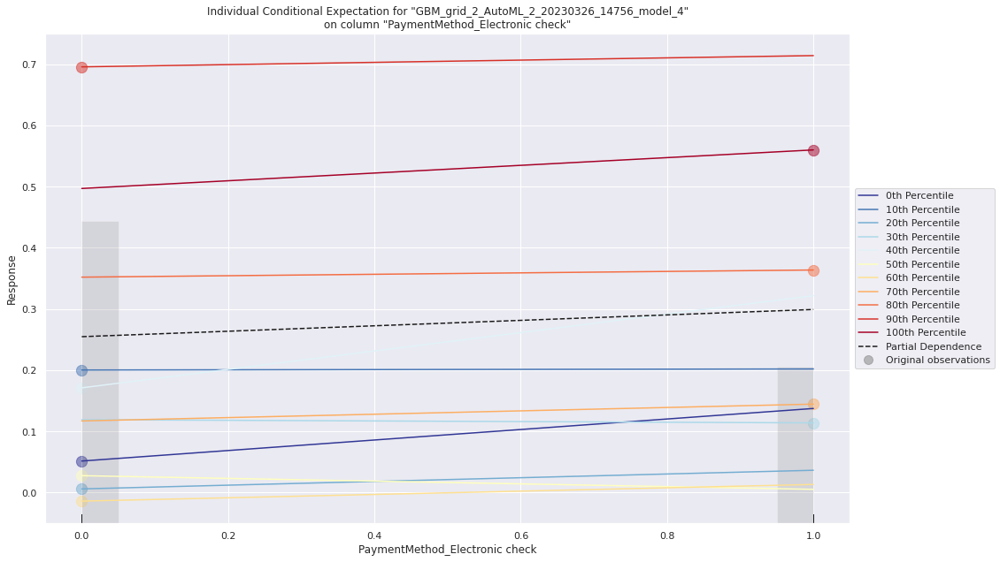

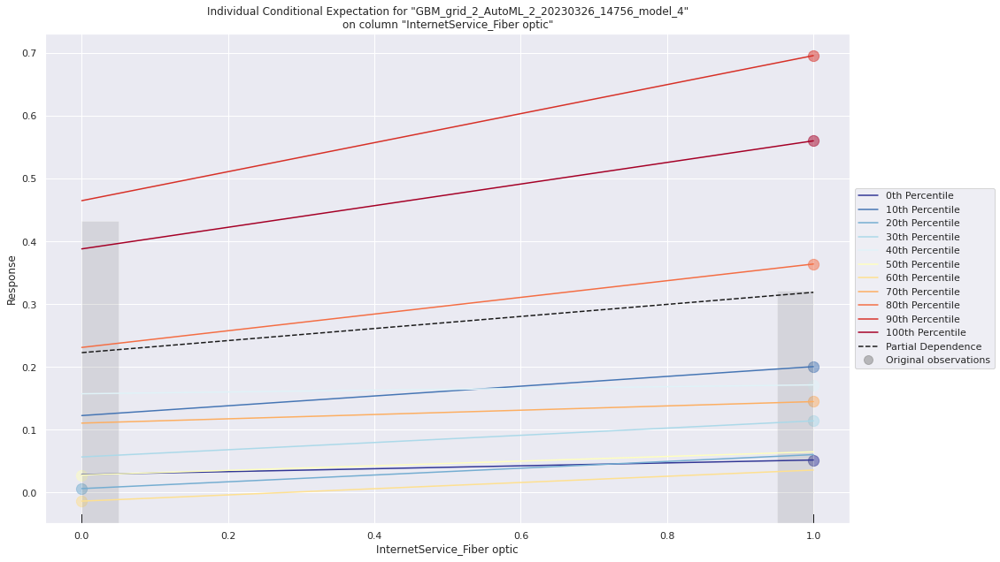

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_2_AutoML_2_20230326_14756_model_2,0.0557426,0.00310723,0.0359839,0.0415773,0.00310723,245,0.008623,XGBoost
XGBoost_5_AutoML_2_20230326_14756,0.14941,0.0223235,0.103794,0.109594,0.0223235,211,0.005042,XGBoost
DRF_2_AutoML_2_20230326_14756,0.150049,0.0225146,0.10019,0.107308,0.0225146,294,0.007728,DRF
XGBoost_grid_2_AutoML_2_20230326_14756_model_3,0.16625,0.0276392,0.110701,0.118768,0.0276392,166,0.00464,XGBoost
XGBoost_4_AutoML_2_20230326_14756,0.193166,0.0373132,0.134002,0.139852,0.0373132,249,0.004622,XGBoost
XGBoost_grid_2_AutoML_2_20230326_14756_model_1,0.197305,0.0389294,0.134374,0.140108,0.0389294,230,0.004782,XGBoost
DeepLearning_grid_4_AutoML_2_20230326_14756_model_2,0.217839,0.0474538,0.142579,0.154069,0.0474538,19874,0.006948,DeepLearning
XGBoost_grid_2_AutoML_2_20230326_14756_model_4,0.254856,0.0649517,0.177947,0.179993,0.0649517,97,0.00292,XGBoost
XGBoost_grid_2_AutoML_2_20230326_14756_model_5,0.255078,0.0650648,0.181857,0.181392,0.0650648,128,0.005914,XGBoost
XGBoost_6_AutoML_2_20230326_14756,0.256408,0.0657451,0.177479,0.180707,0.0657451,126,0.002795,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [52]:
# AutoML Explainability
aml.explain(test)

In [53]:
# Taking 100 samples out for SHAP analysis
x_train_100 = shap.utils.sample(
    X_train, 100
) 

# Taking 100 samples out for SHAP analysis
x_test_100 = shap.utils.sample(
    X_test, 100
)  

In [54]:
# Initializing a Linear Model
linear_model = sklearn.linear_model.LinearRegression()  
# Training a linear model
linear_model.fit(X_train, y_train)  

LinearRegression()

Permutation explainer: 4908it [02:41, 29.08it/s]                          


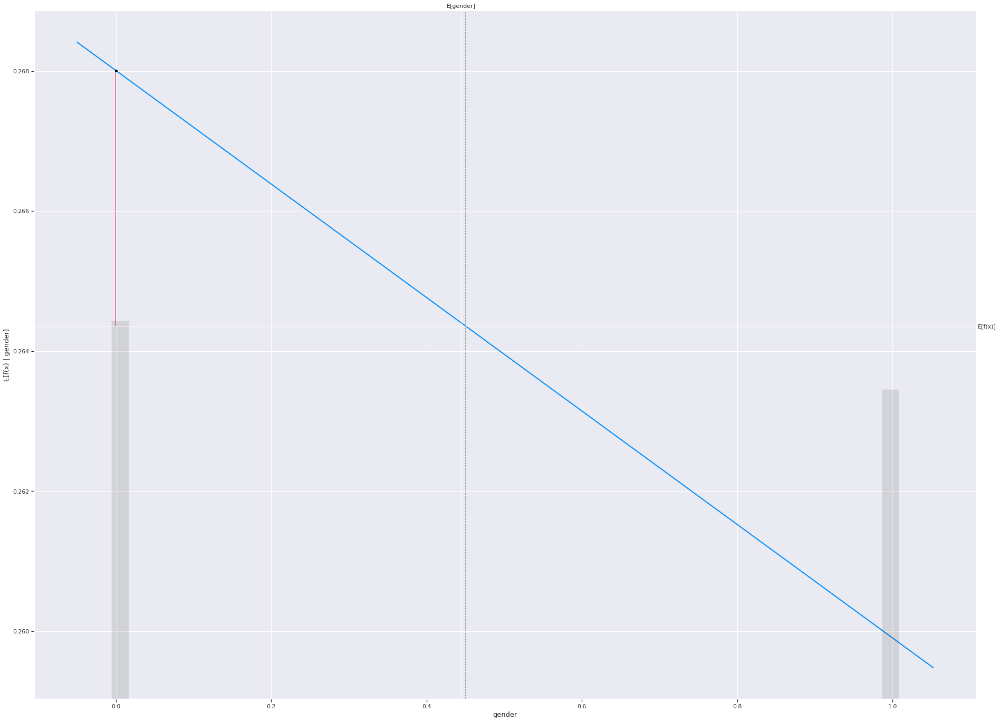

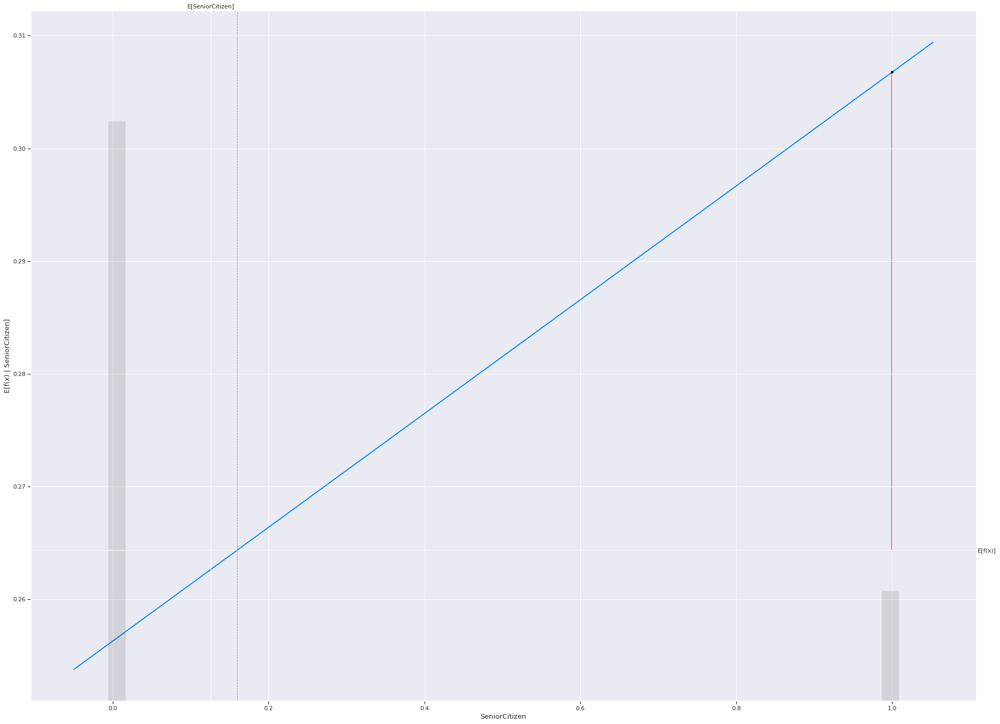

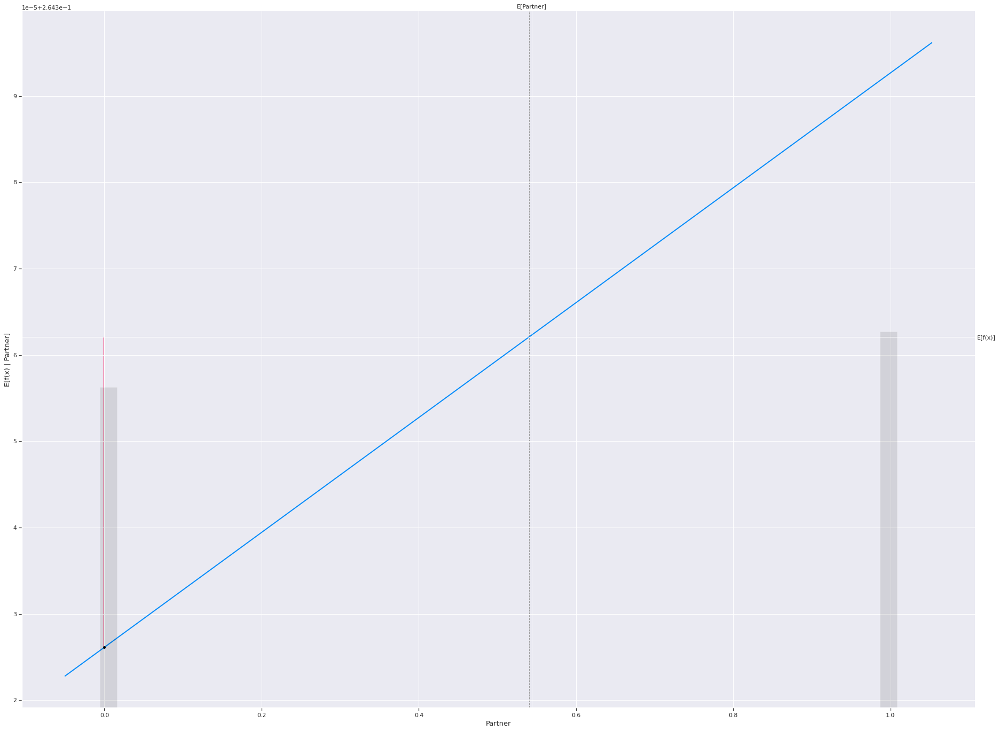

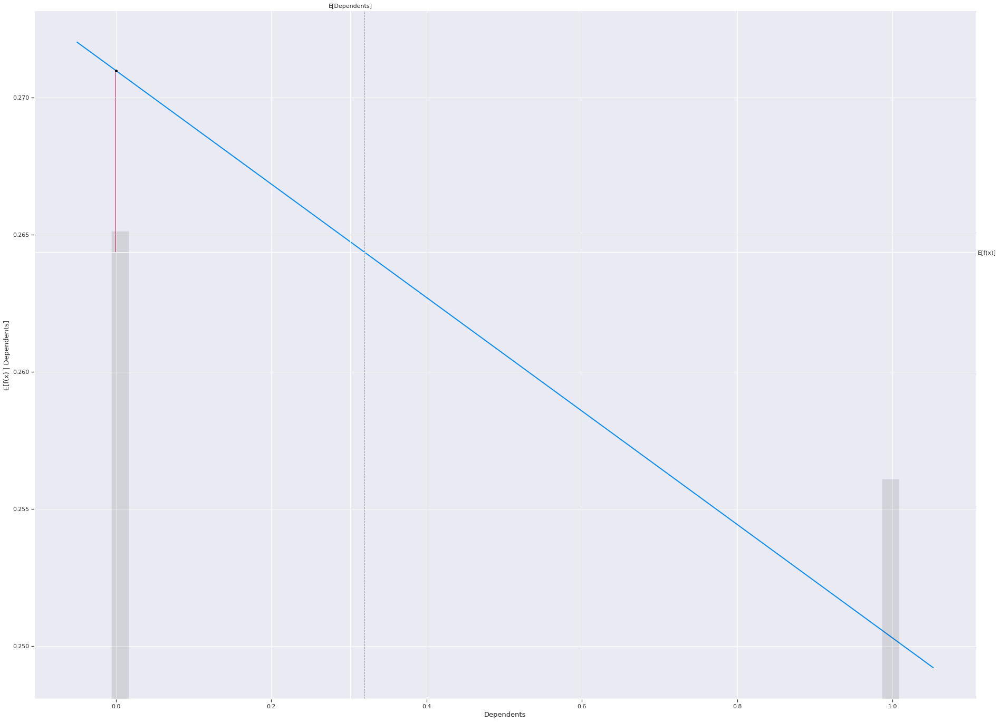

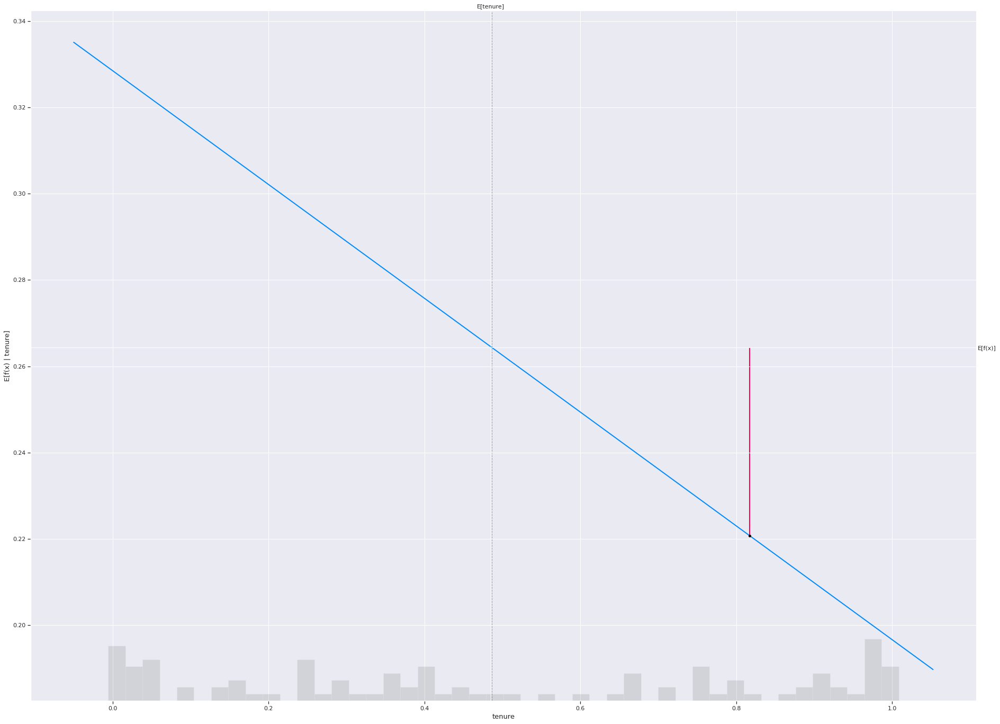

...

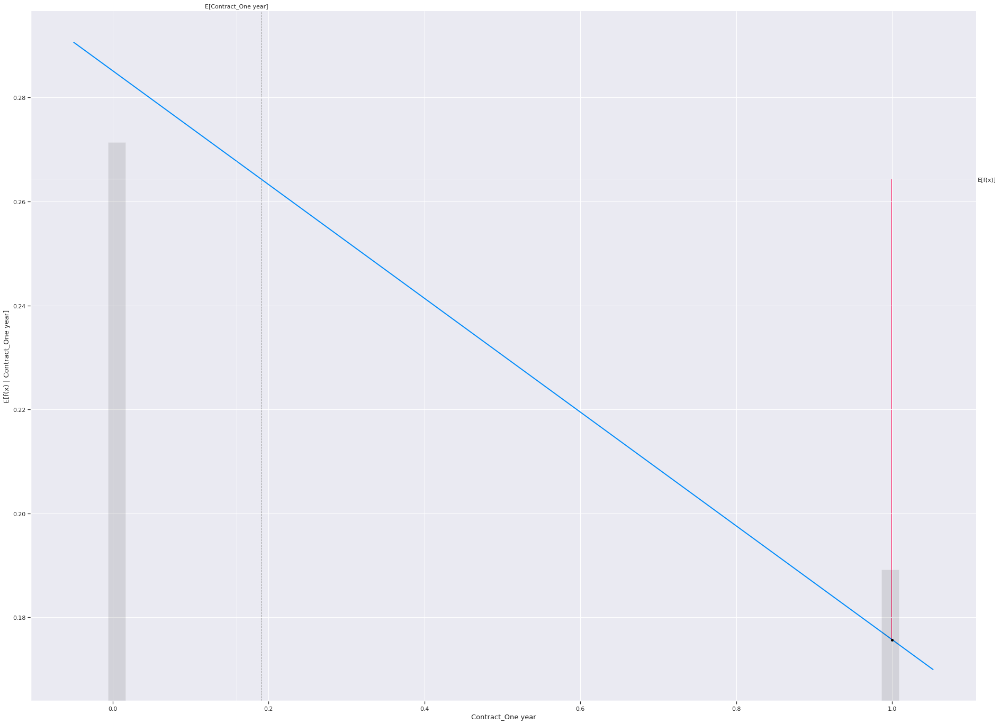

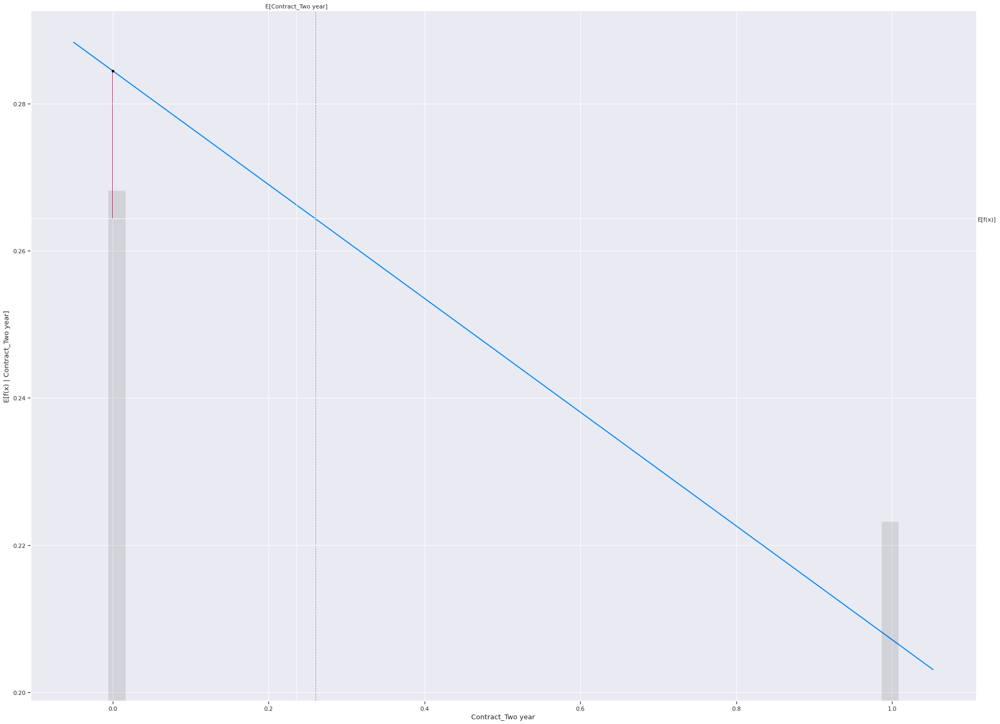

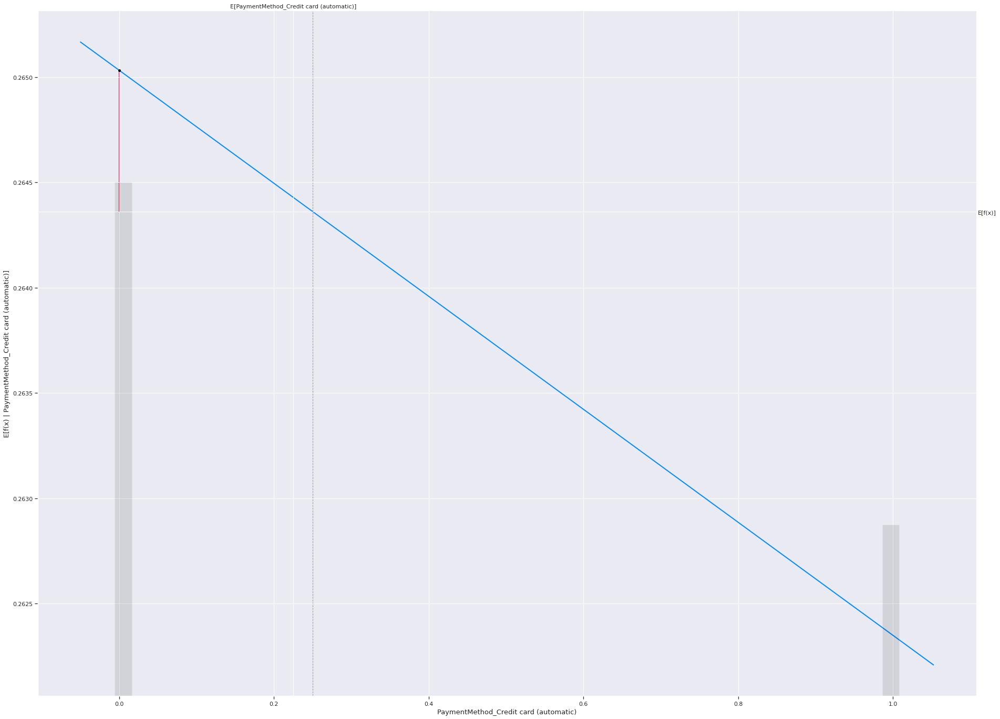

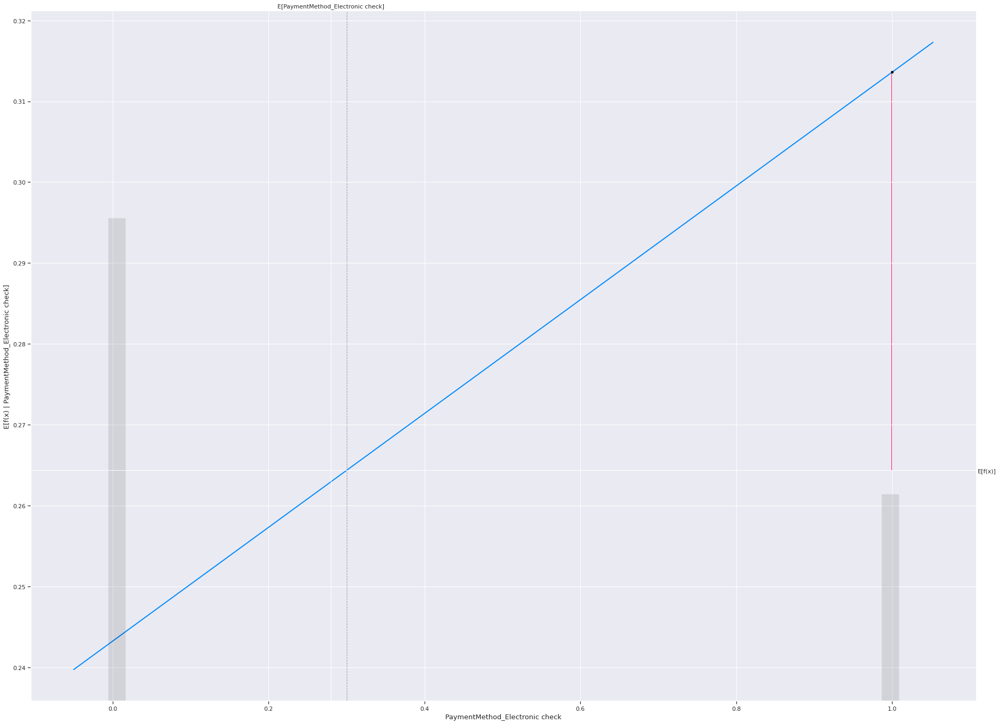

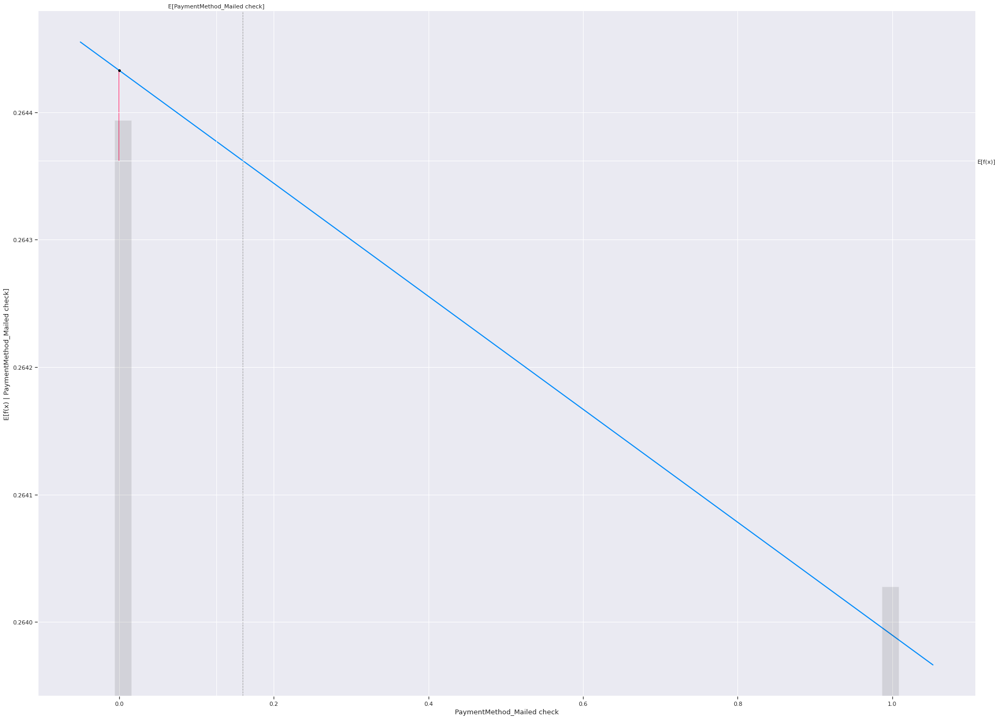

In [55]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

Streaming output truncated to the last 5000 lines.
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
Permutation explainer:  89%|████████▉ | 4364/4907 [03:10<00:24, 22.39it/s]X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted withou

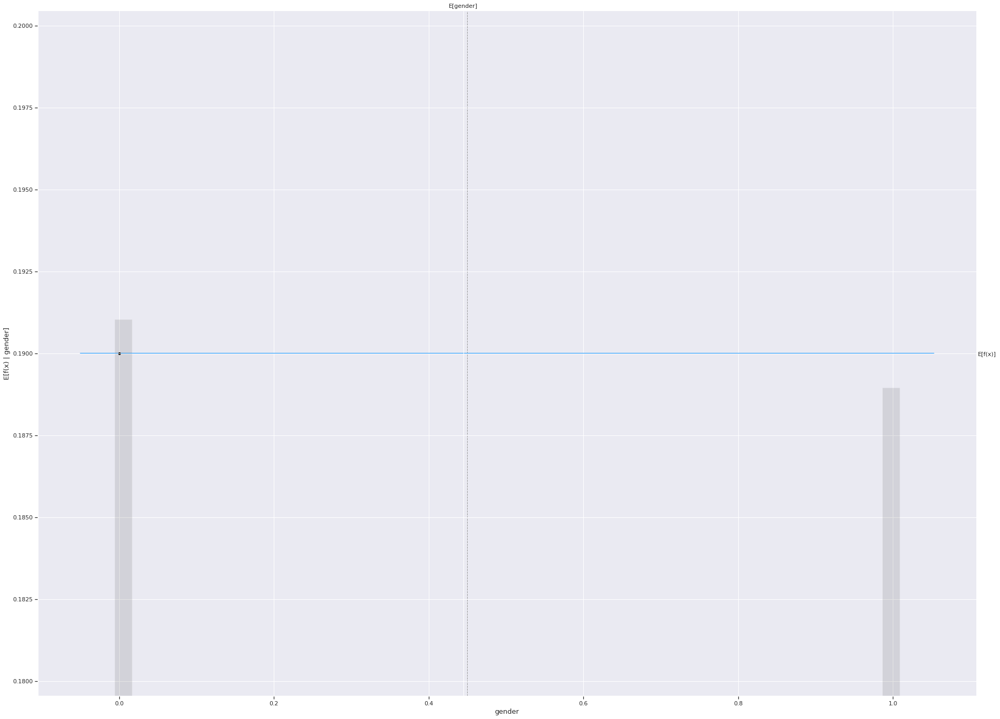

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

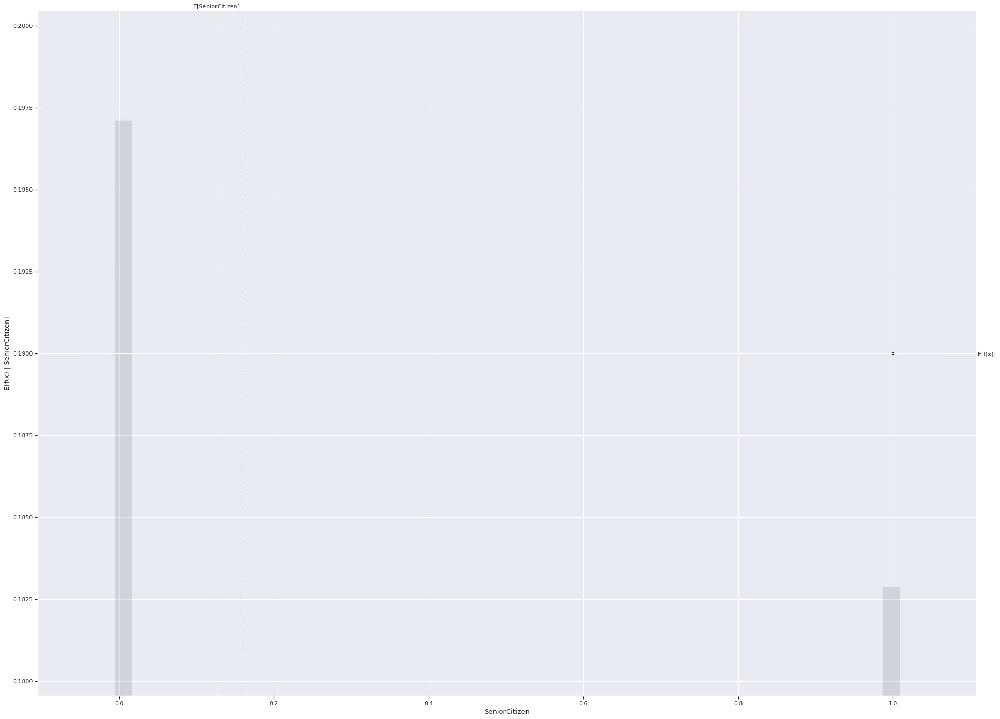

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

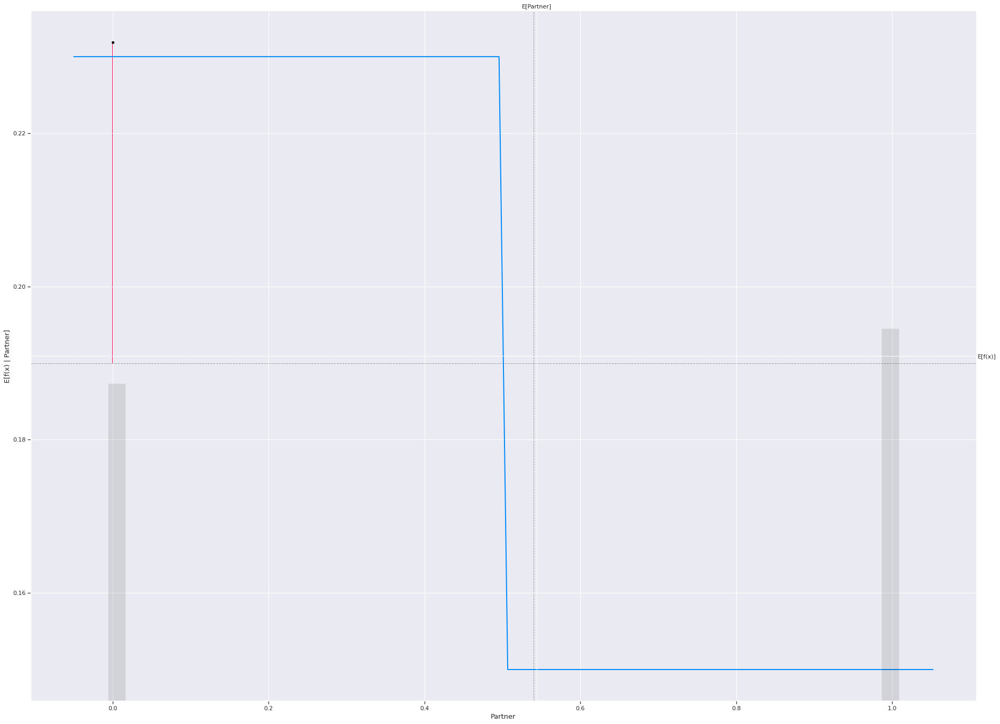

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

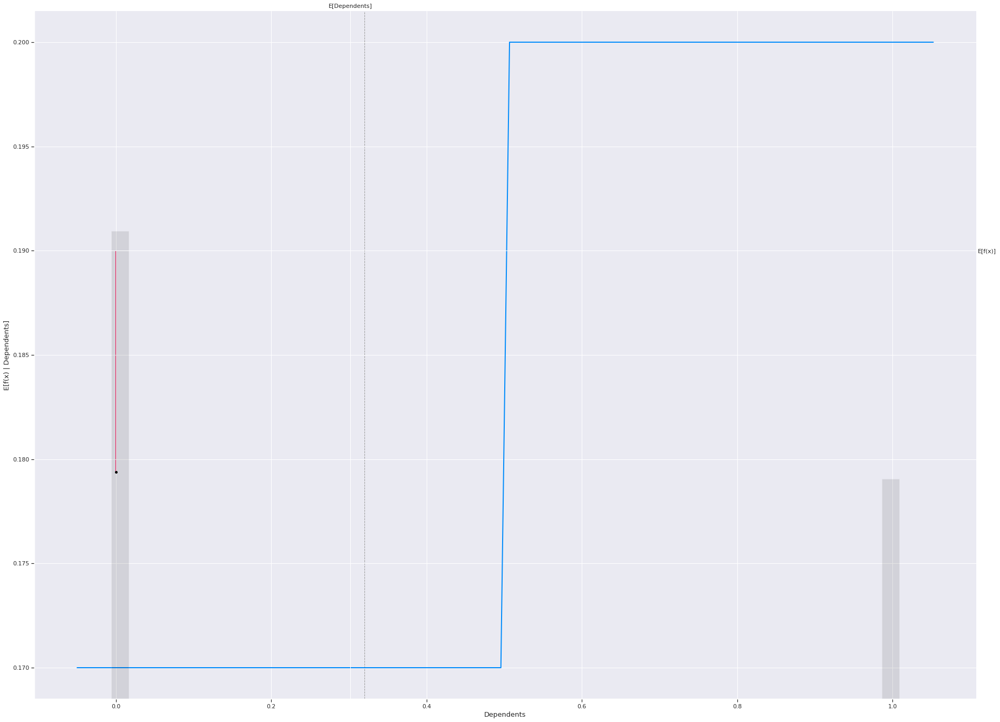

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

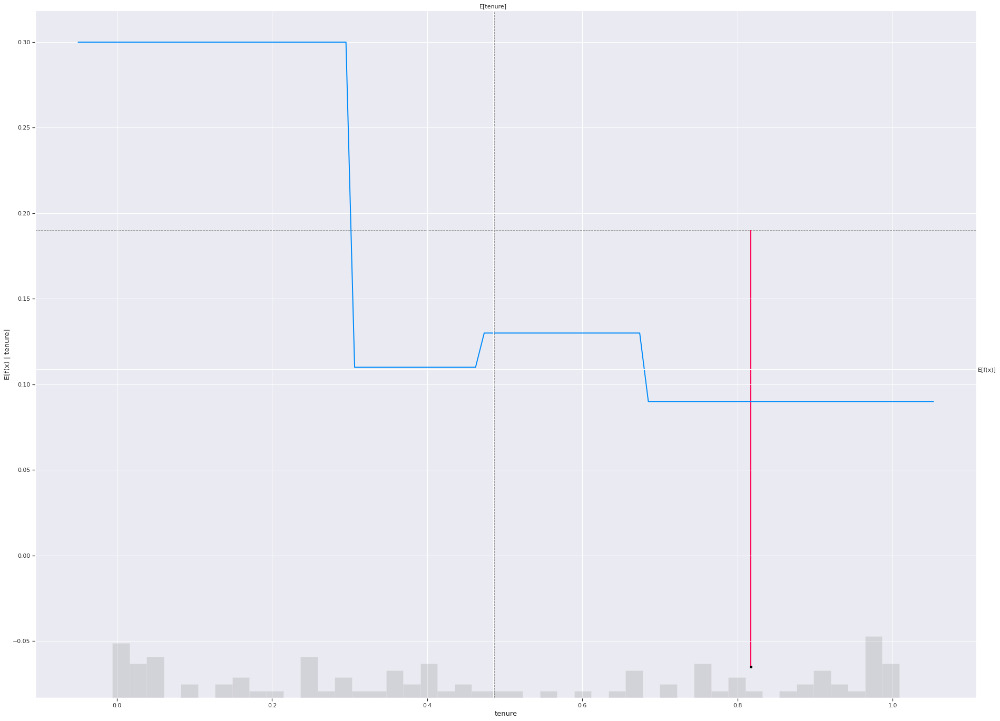

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

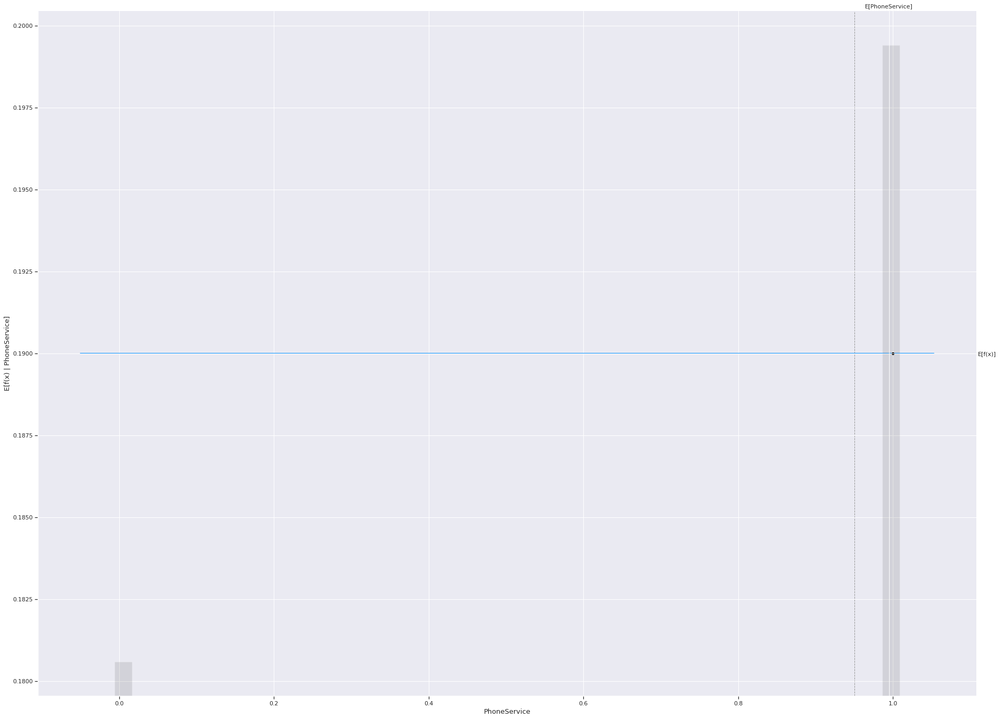

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

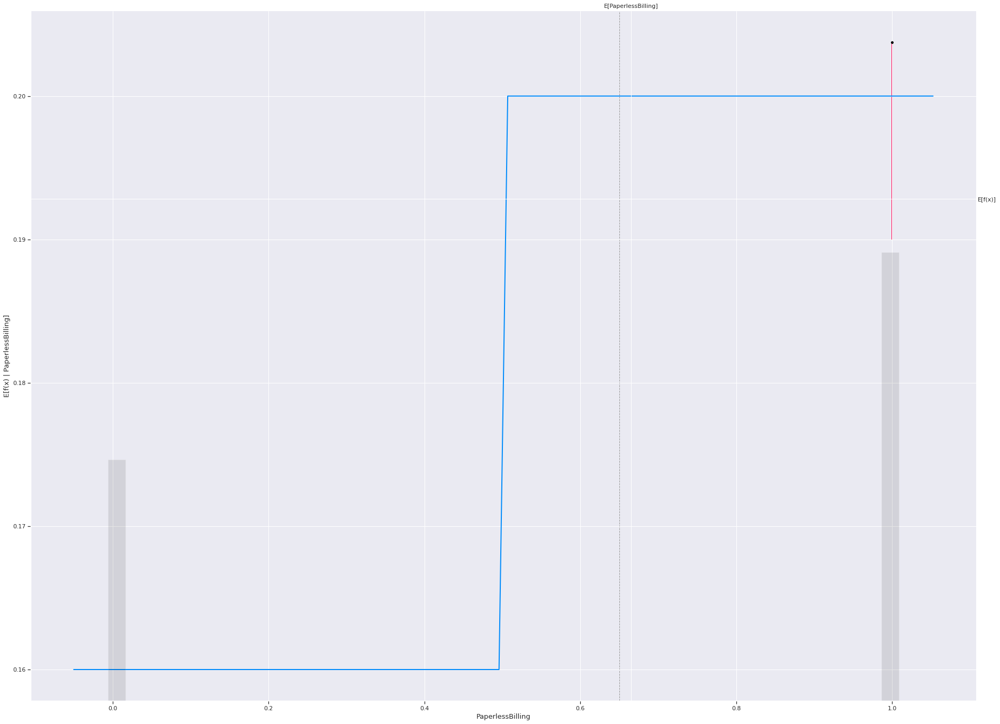

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

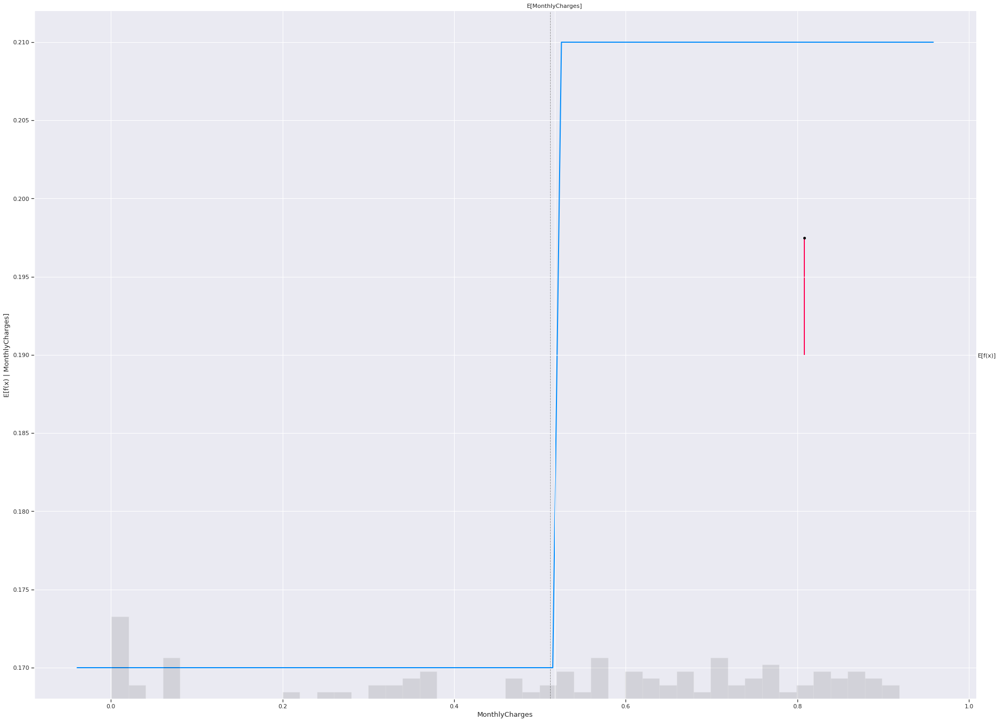

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

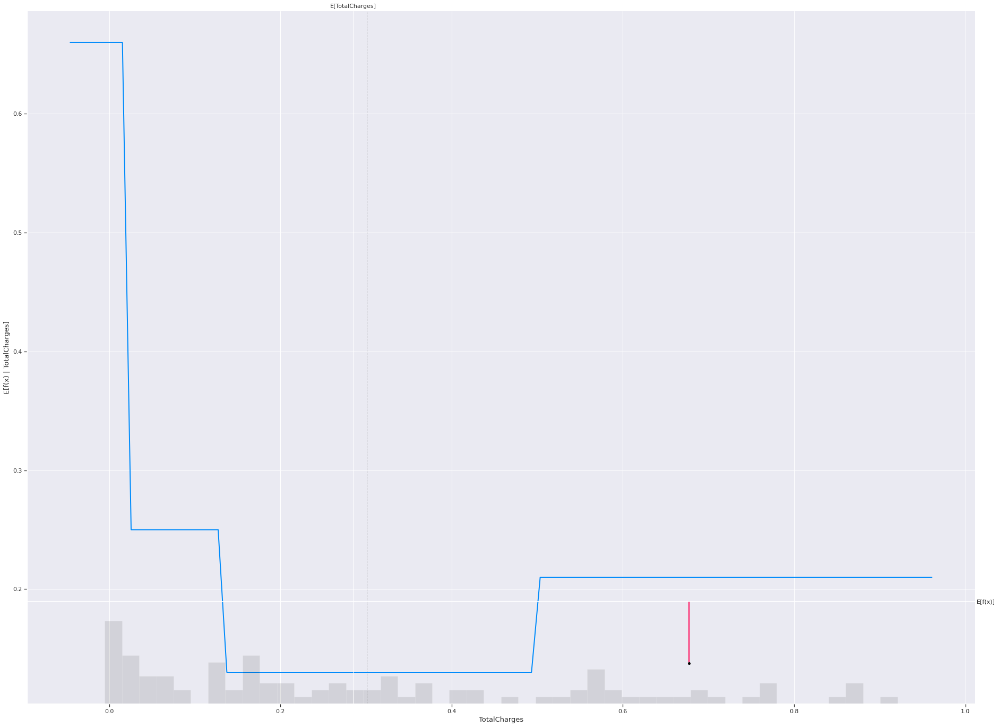

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

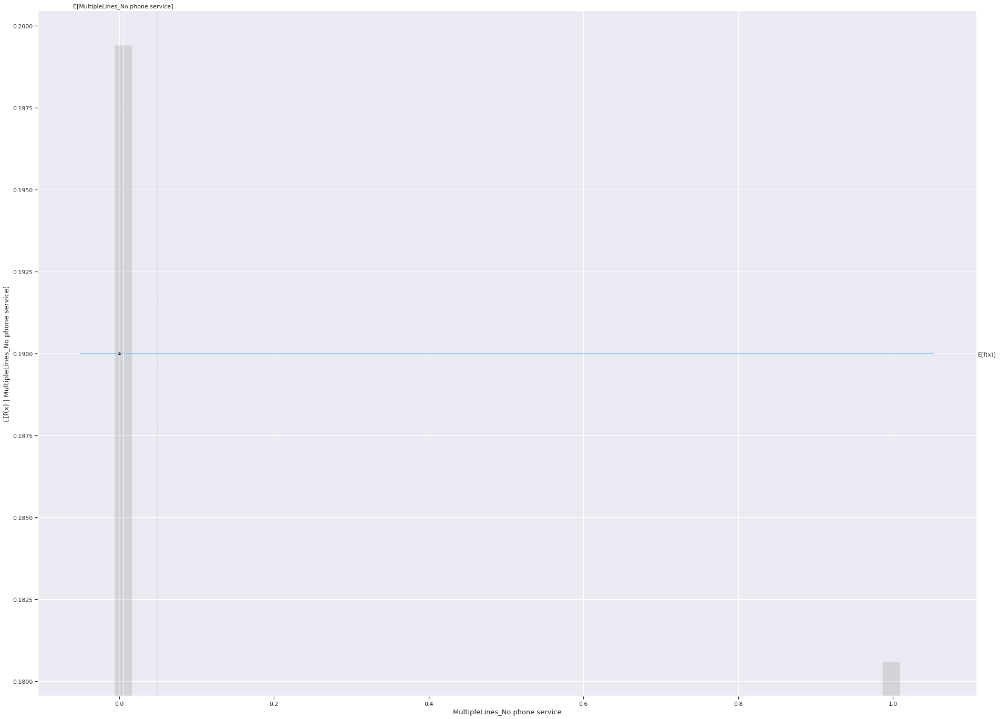

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

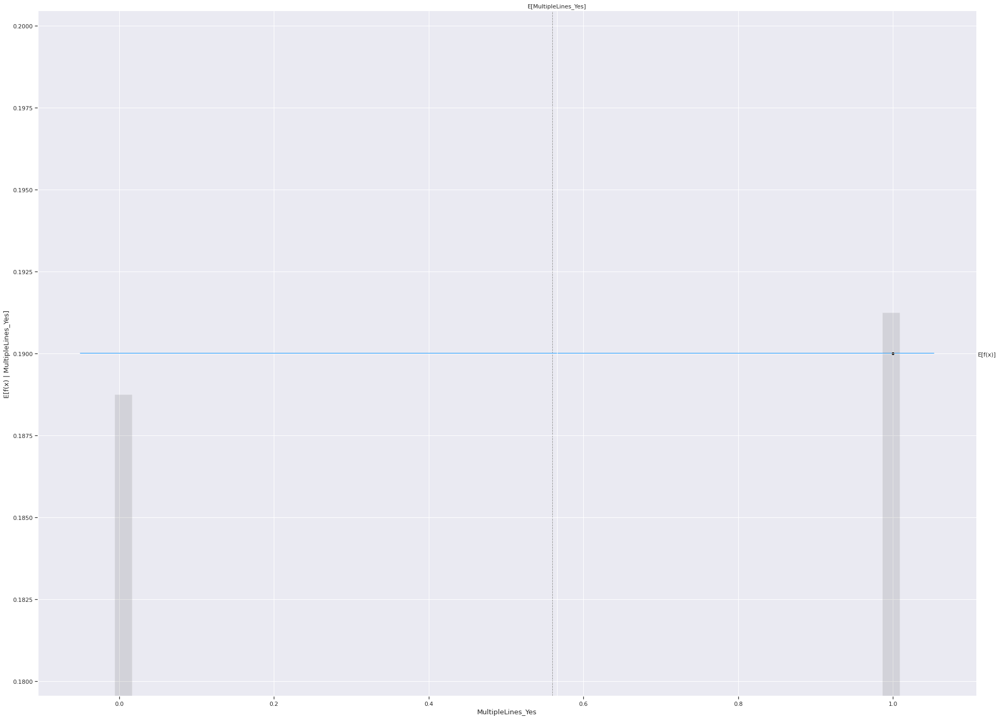

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

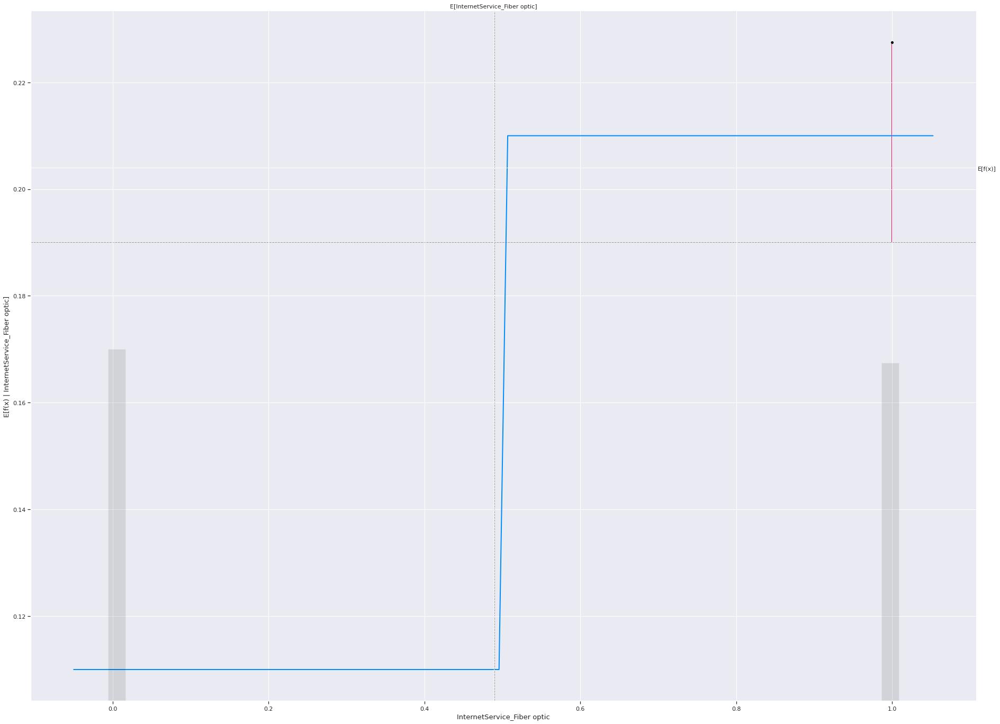

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

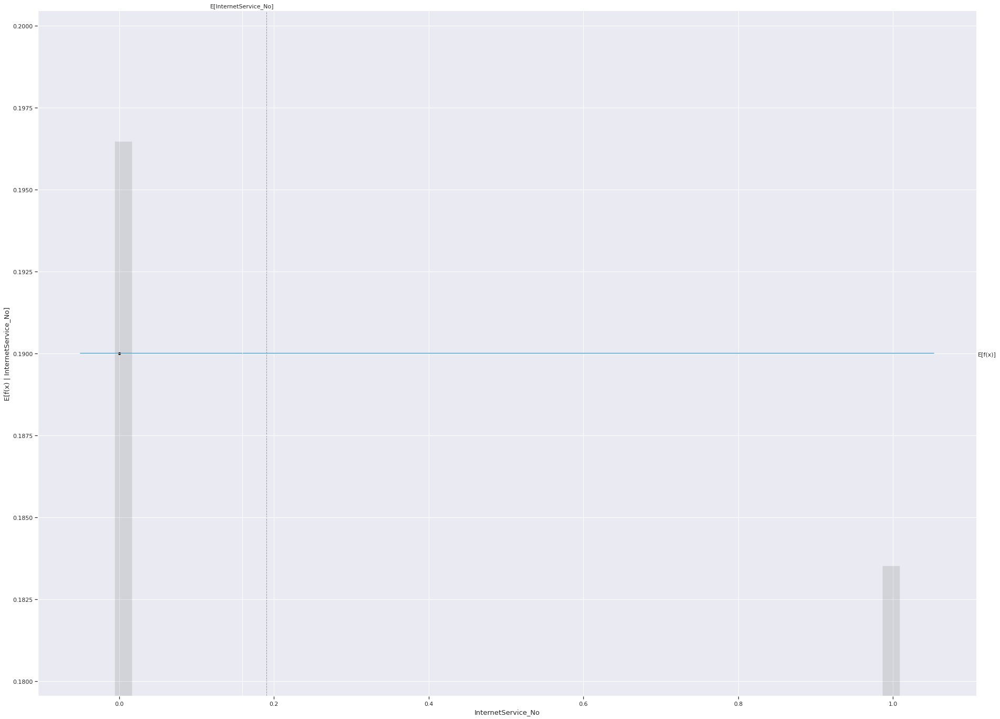

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

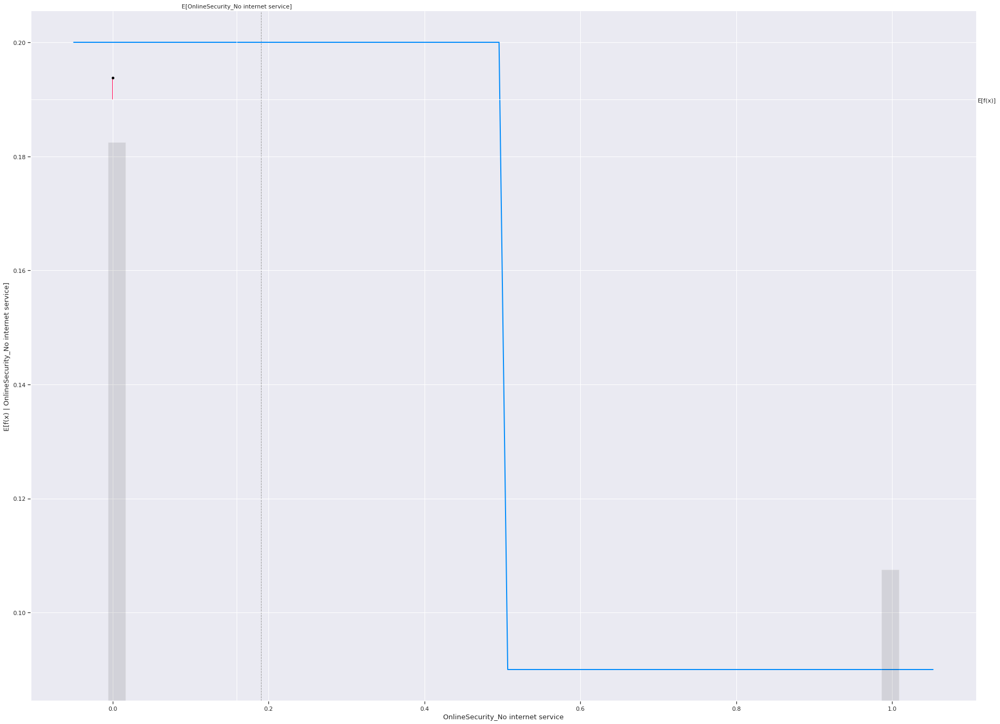

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

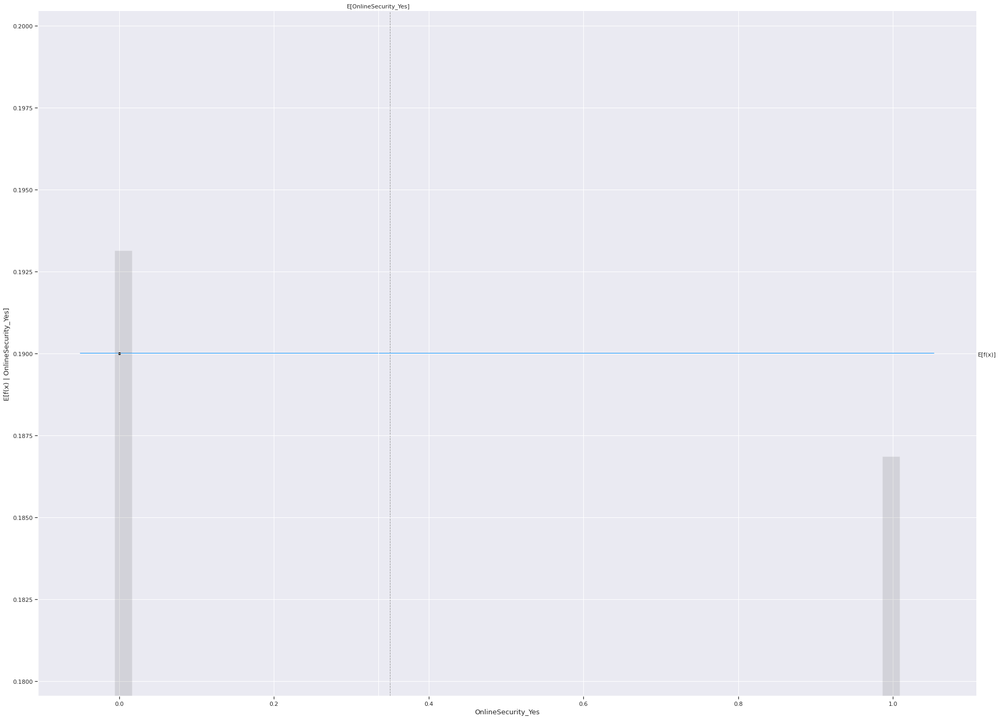

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

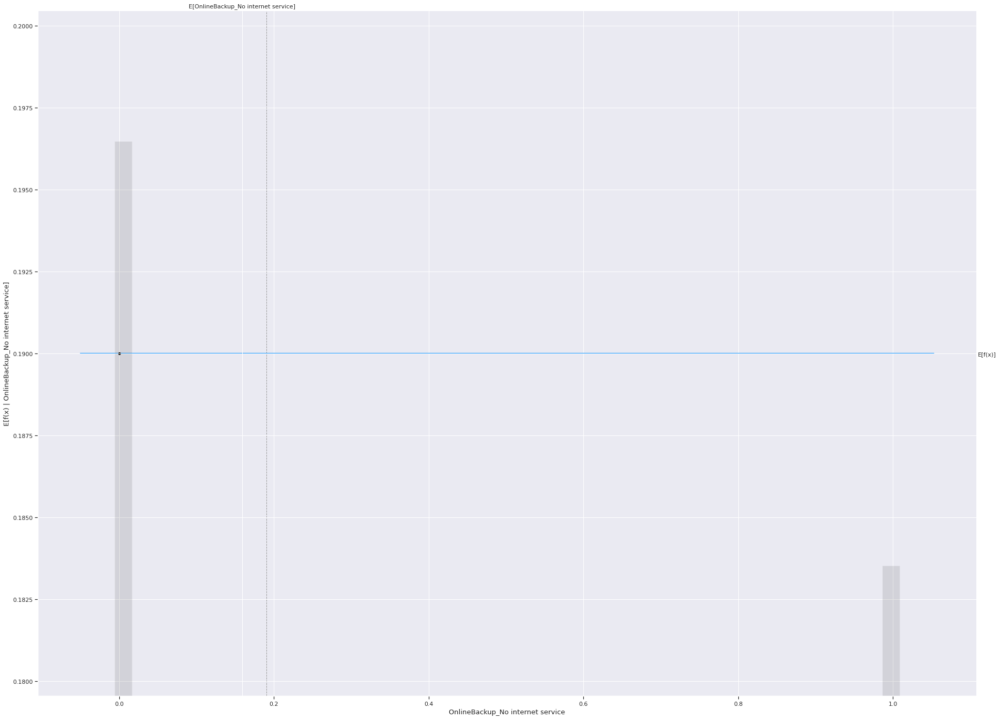

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

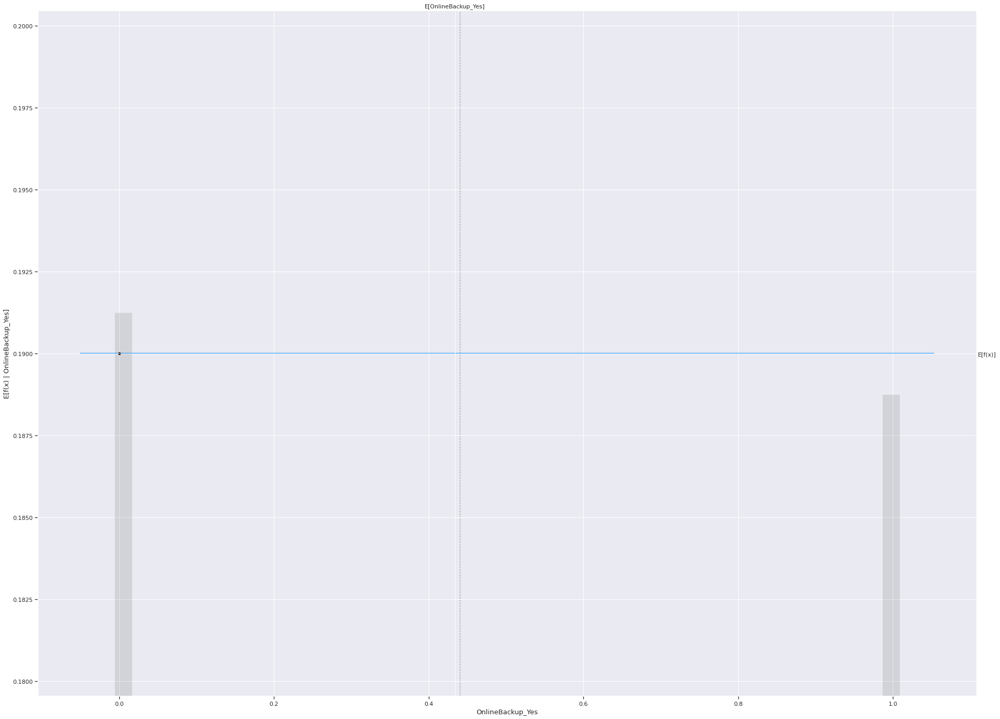

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

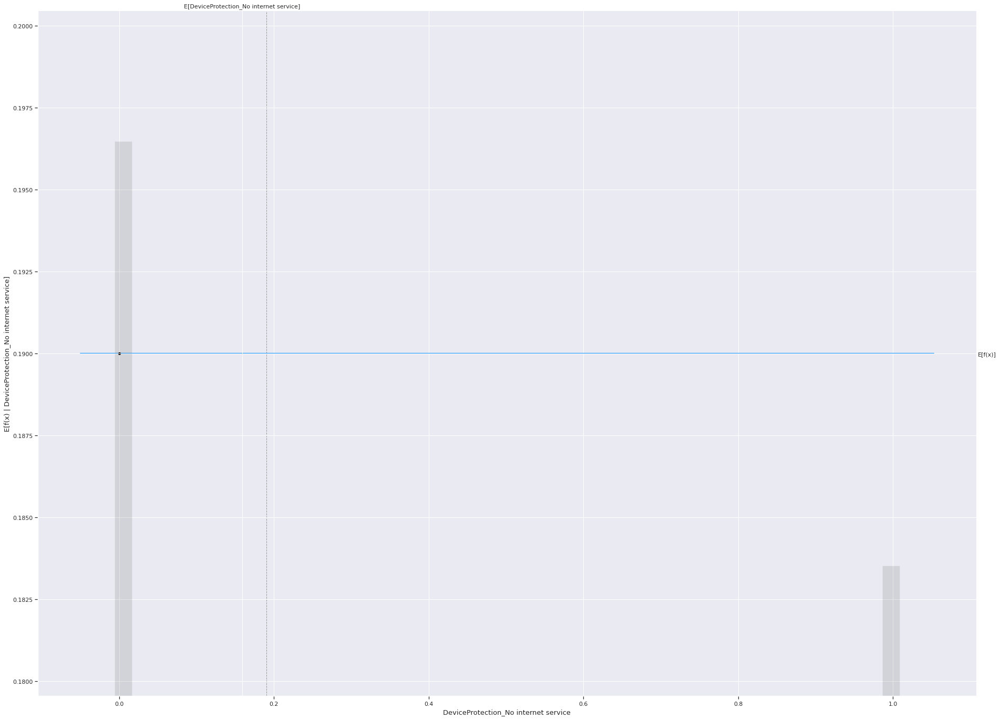

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

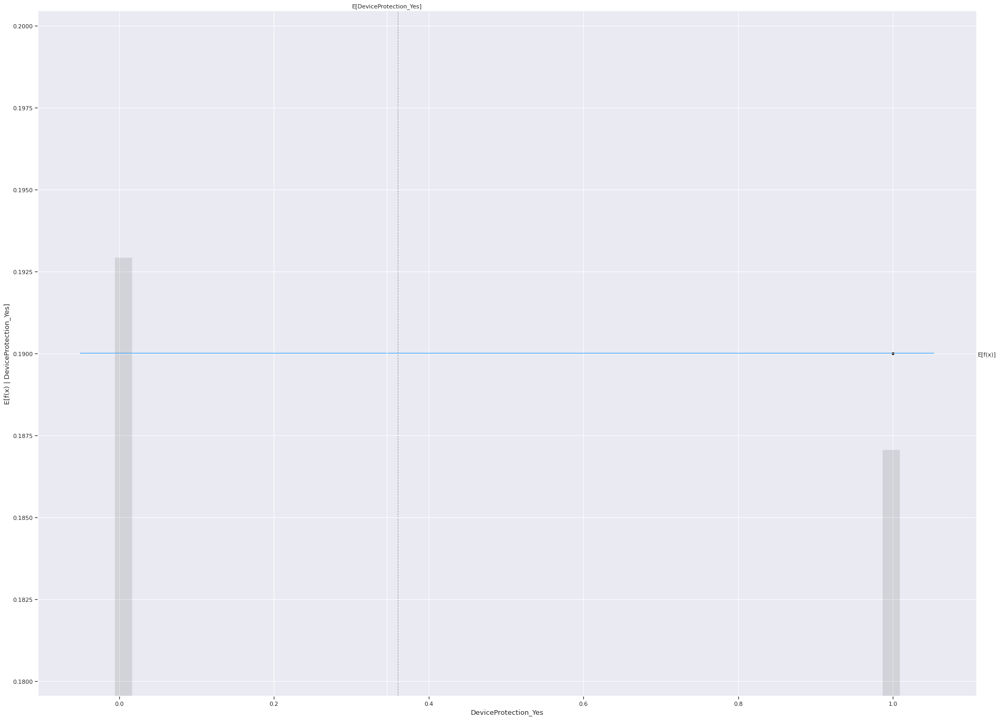

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

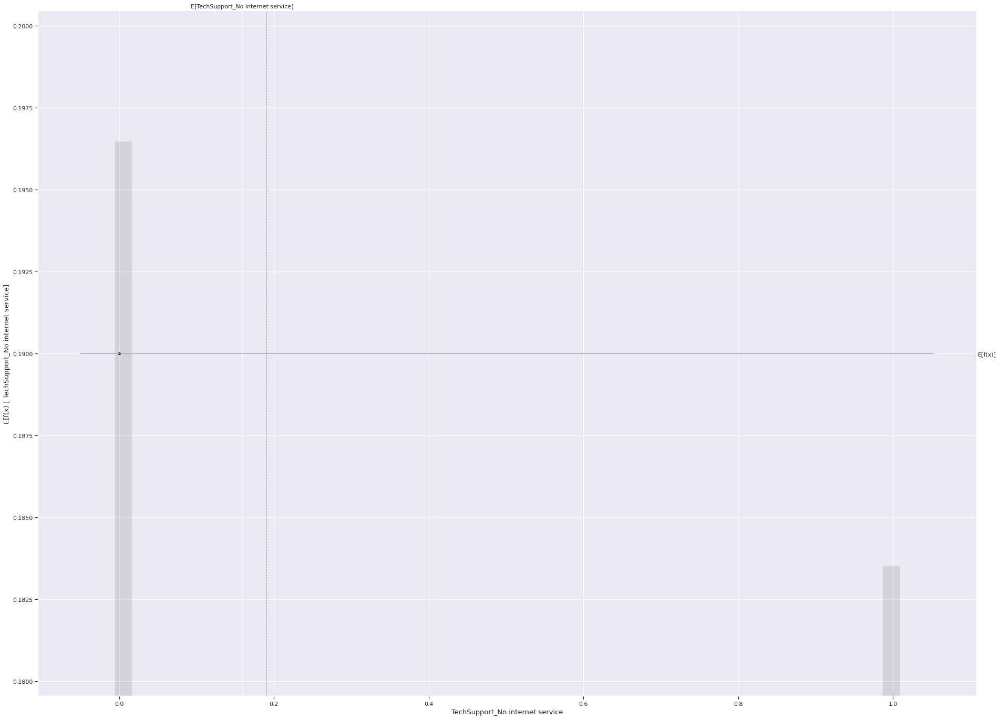

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

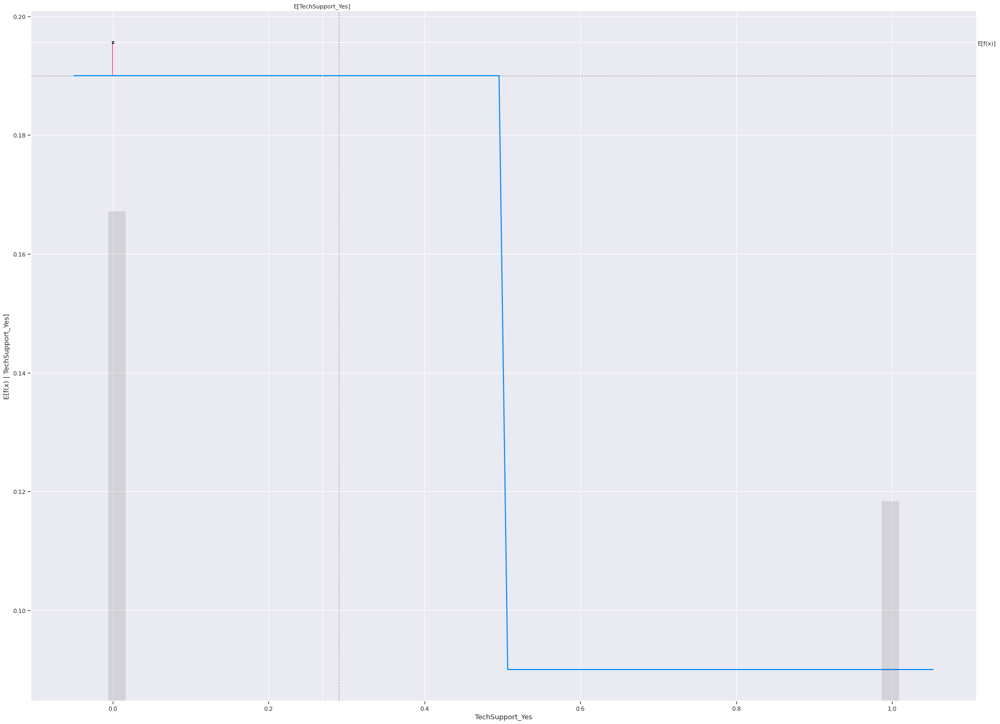

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

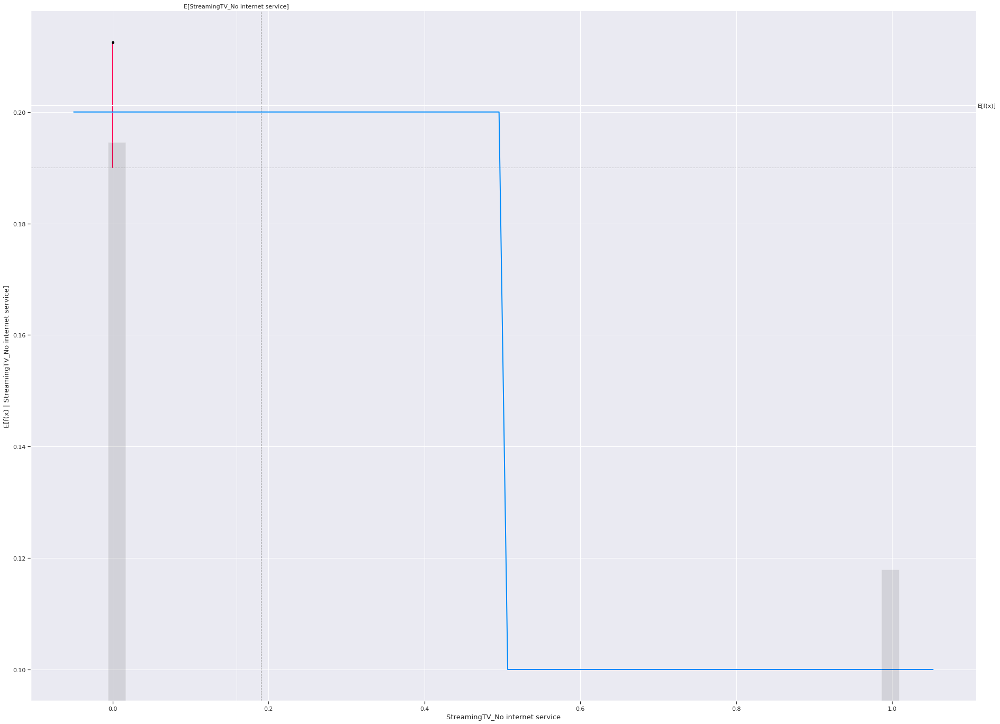

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

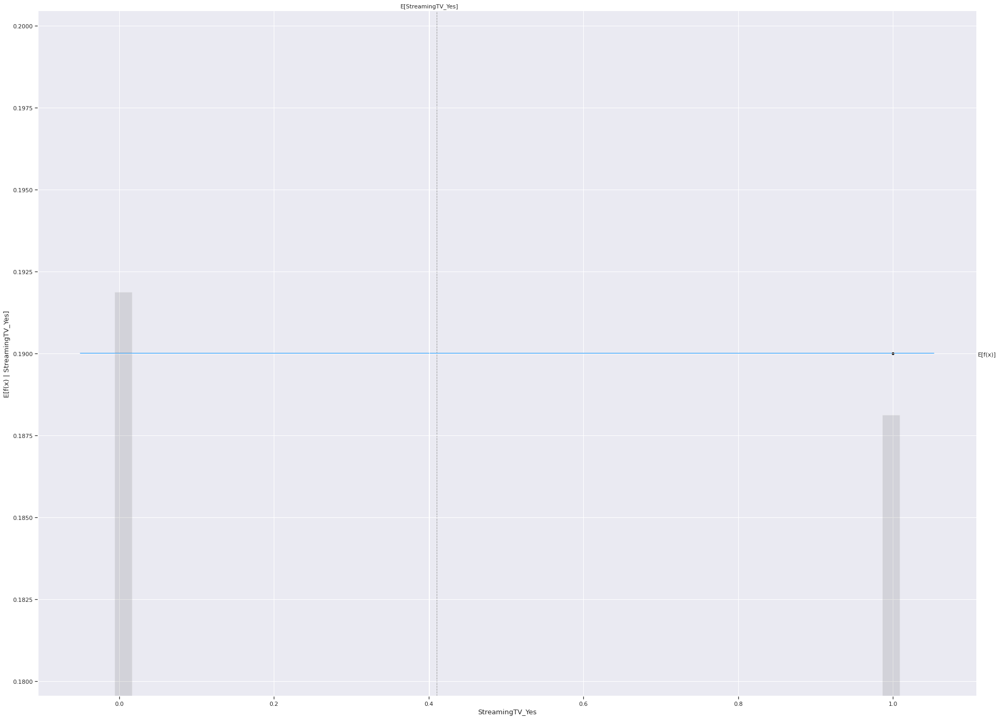

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

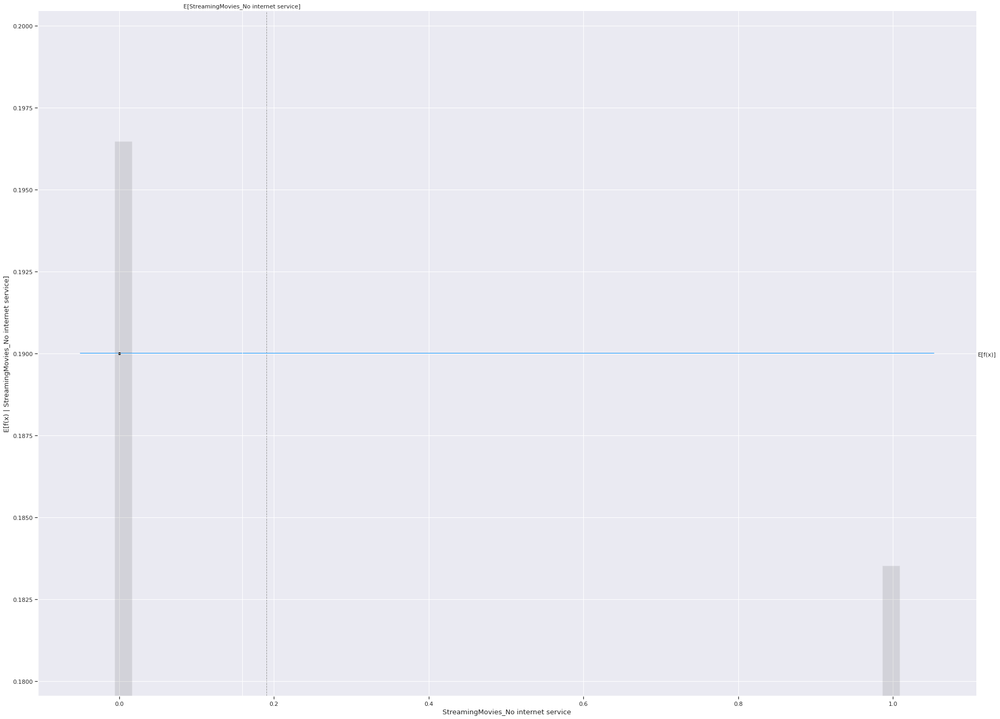

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

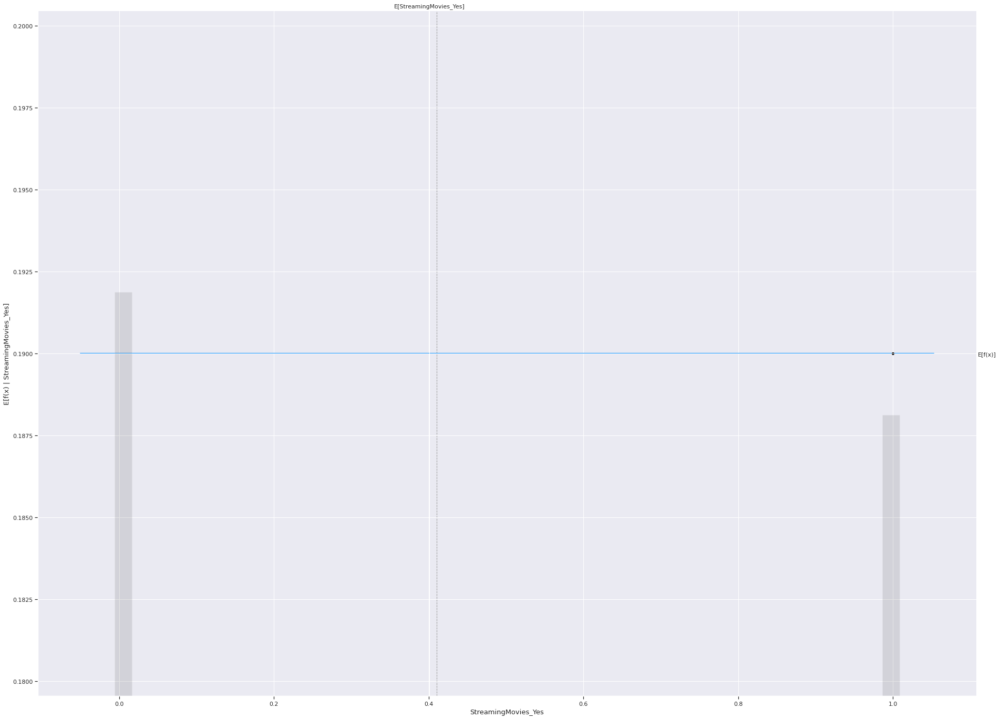

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

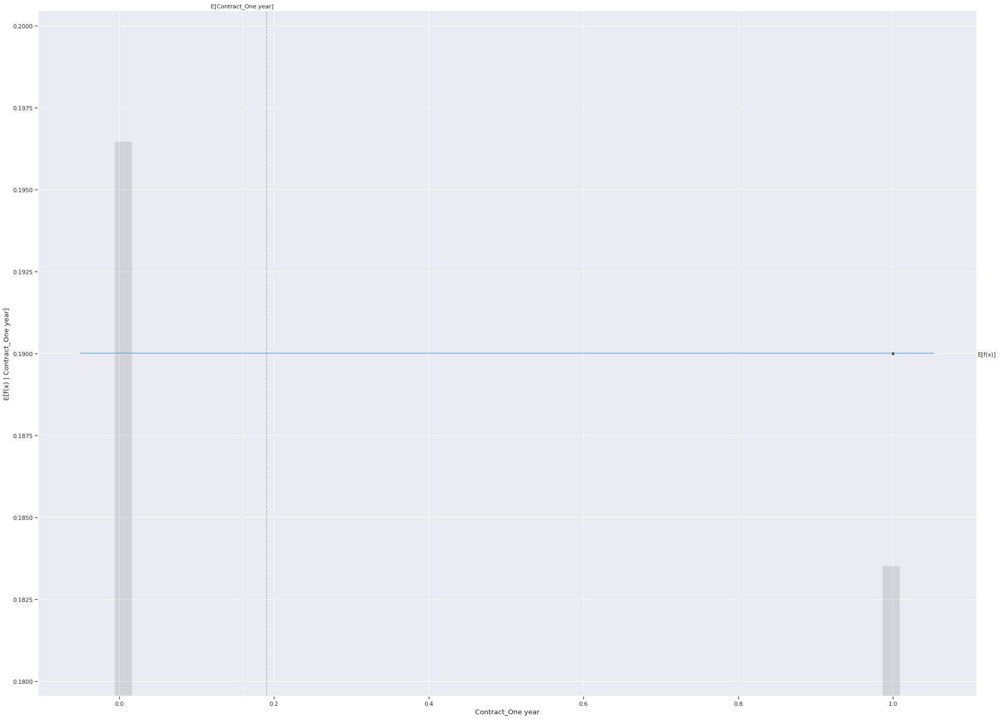

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

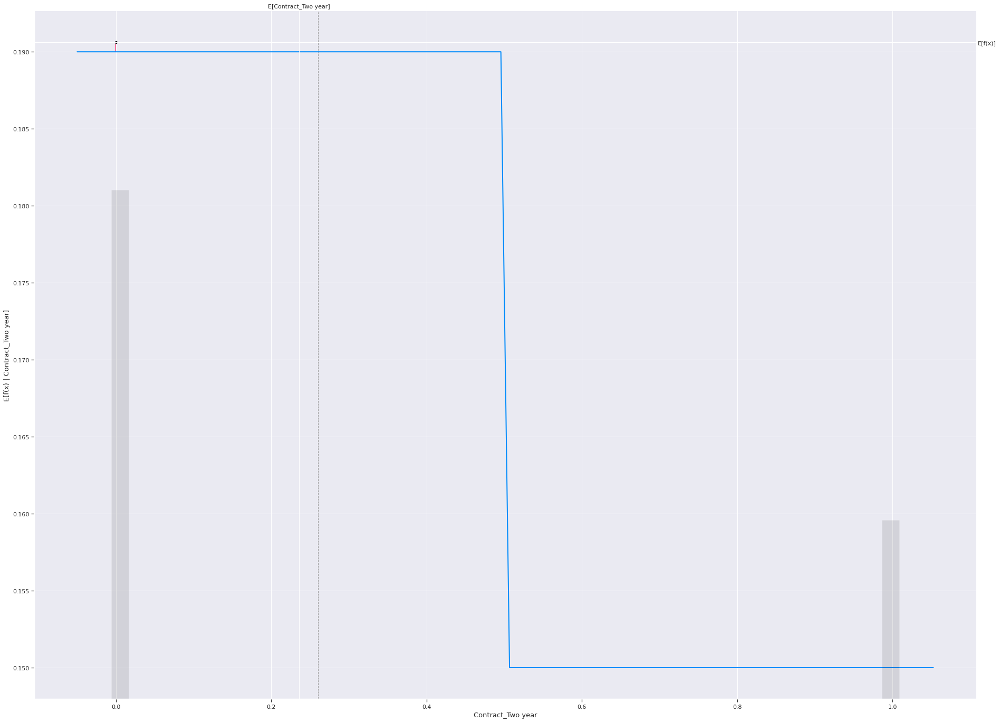

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

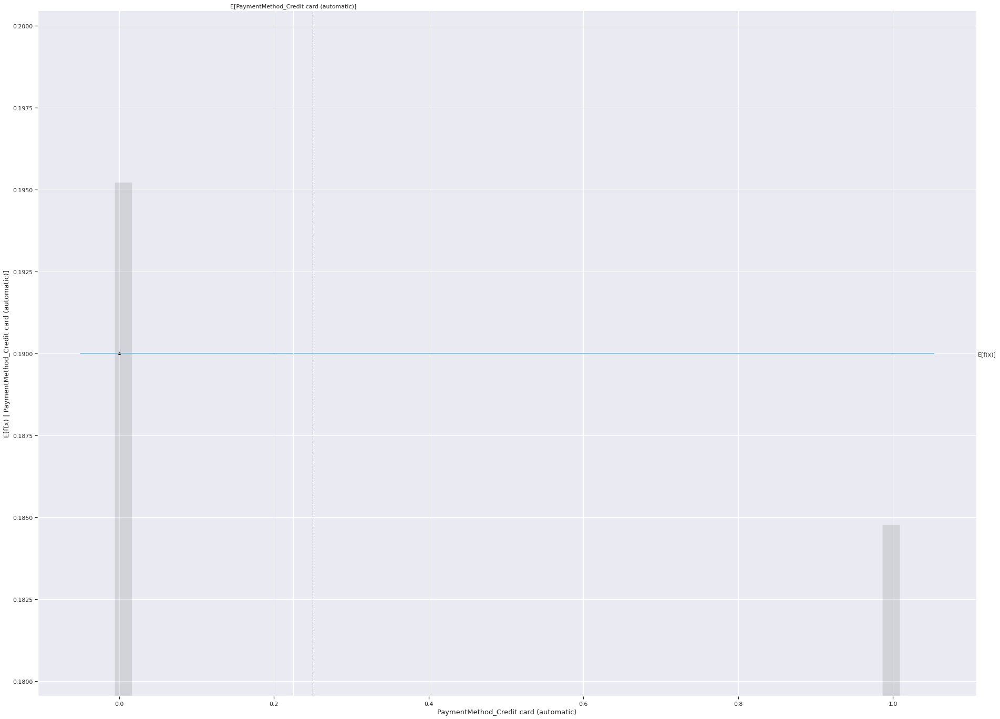

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

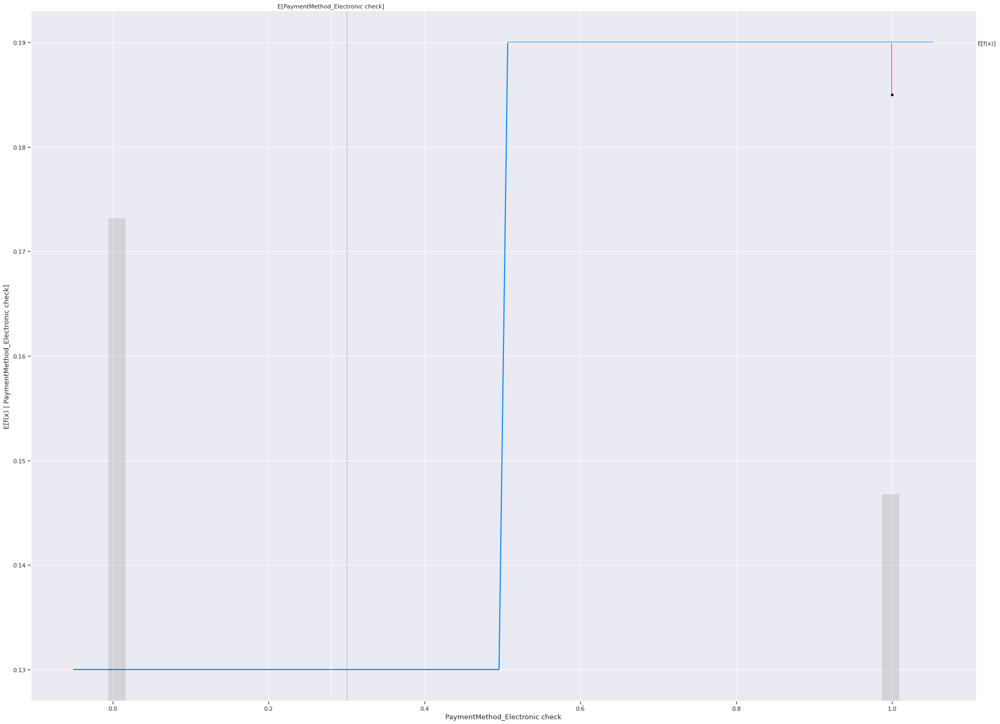

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

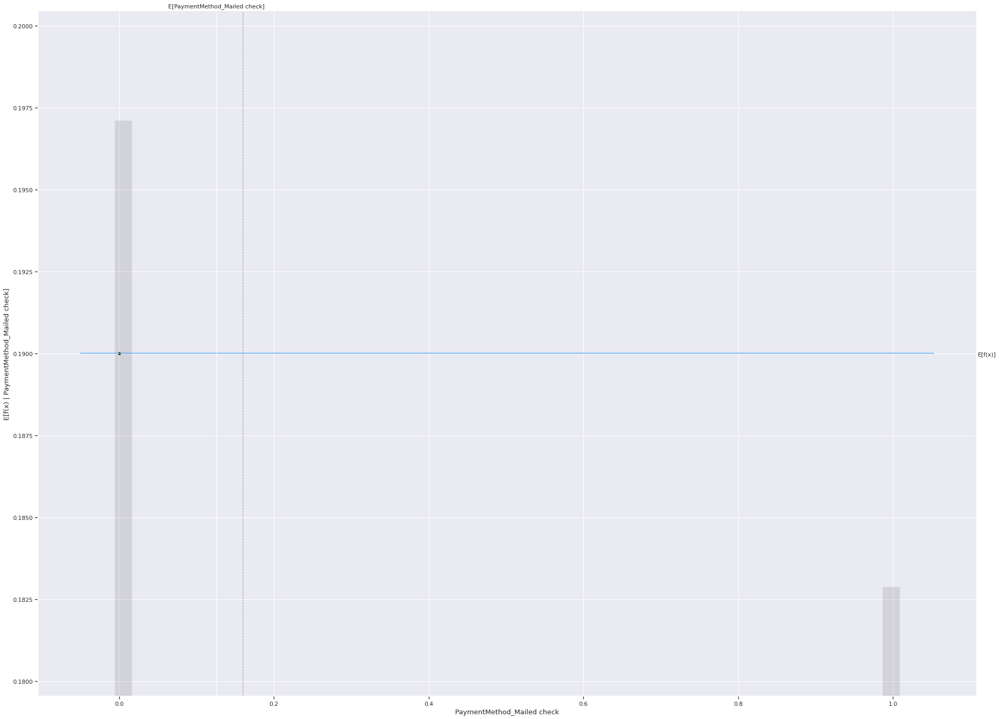

In [56]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

# **Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

SHAP feature importance- Features with large absolute Shapley values are important. 

The following plots are:-
1. SHAP feature importance for a linear model
2. SHAP feature importance for tree-based model

For the linear model, InternetService_Fiber Optic is the second most important feature but for tree-based model tenure is the second most important feature.

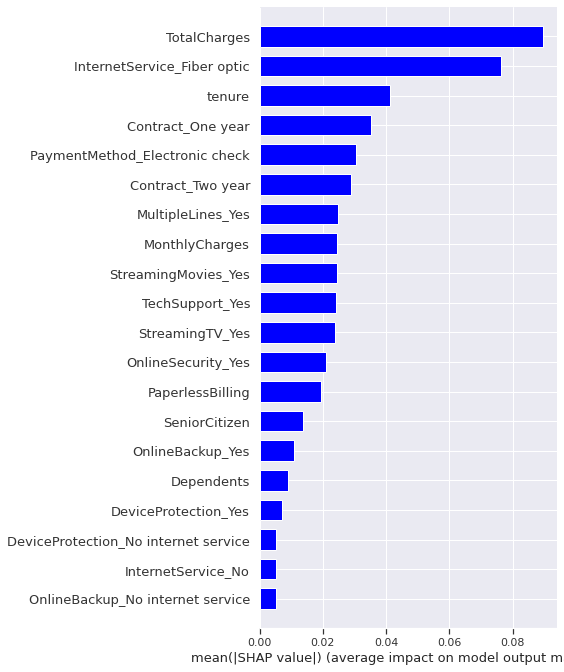

In [57]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, X_train, plot_type="bar", color="blue")

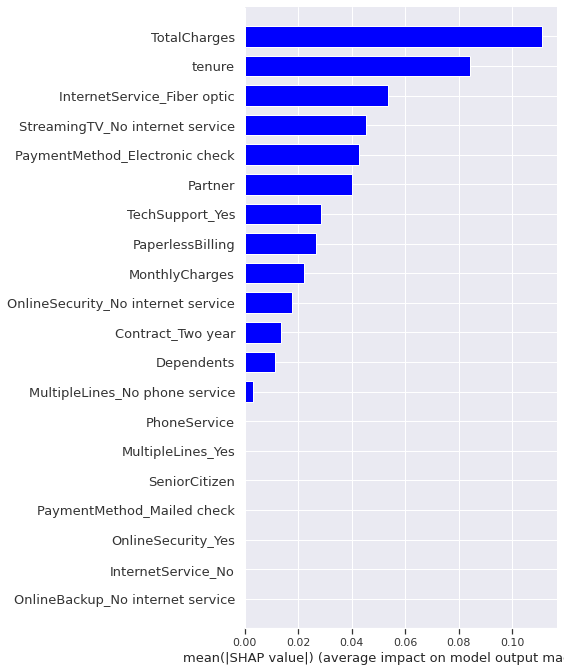

In [58]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, X_train, plot_type="bar", color="blue")

# Interpret the summary plot for the Linear and Tree-based model
Here the features are listed in descending order of their importance. This helps ML model to analyze and how the features are affecting the target and to what extent.


* Each dot(both red and blue) represents a feature
* Red color represents high values whereas blue color represents low value
* If a dot is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
* The position of a dot on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.


Higher value of TotalCharges tends to have a positive impact on the Churn.


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


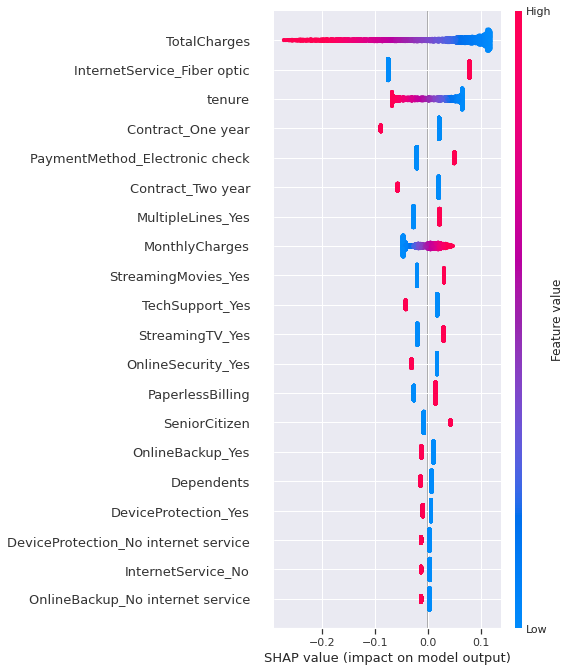

In [59]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, X_train)

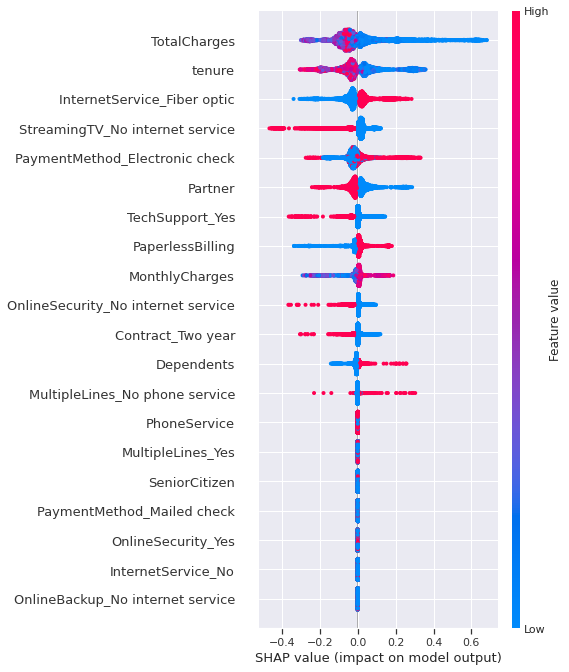

In [60]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, X_train)

# Interpreting Waterfall SHAP visualization

Notice the value of TotalCharges in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 0.363 is what we got as a model output and the expected output for this sample was 0.264. The graph shows that ToalCharges has the biggest and most negative impact in churn rate. Followed by Contract_OneYear had a negative impact and it bought the churn rate down.

Similarly we can interpret the tree-based model for the same sample.
Where the output we got was 0 and the expected output was 0.19. in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the tree-based model, the output is majorly effected on tenure.

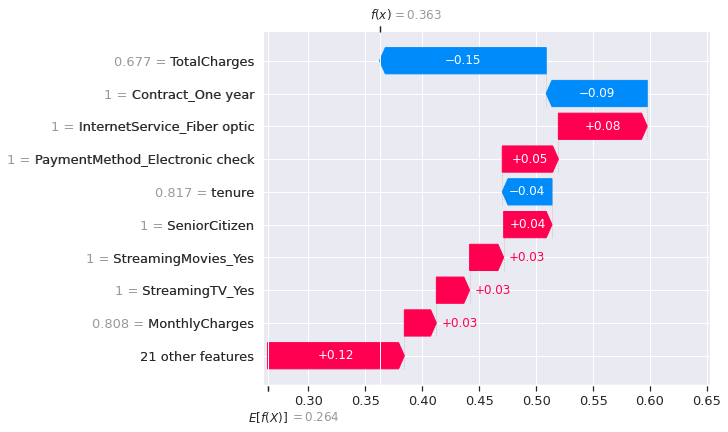

In [61]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=10)

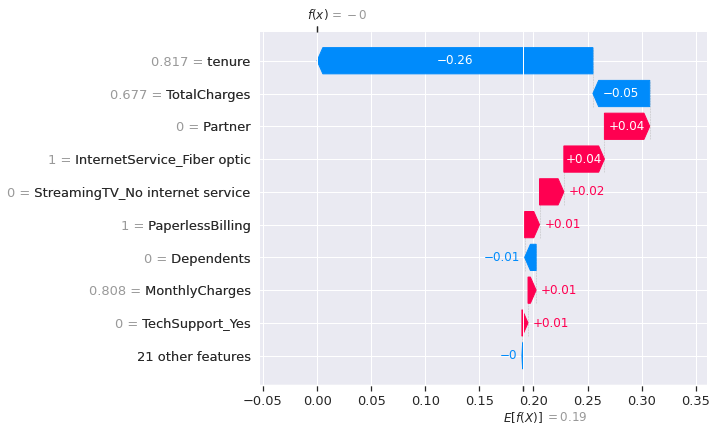

In [62]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=10)

## Interpreting SHAP dependence plot for Linear and Tree-based model
The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex.

As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the Churn rate then the relationship will be directly proportional to TotalCharges and MonthlyCharges vice versa.

For the tree-based model as observed the relationship between feature and its SHAP value is no longer linear. Now we see that the SHAP dependence plot no longer exactly matches the partial dependence plot because they are accounting for the interaction effects. 


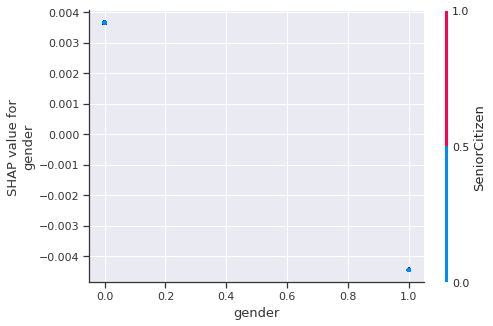

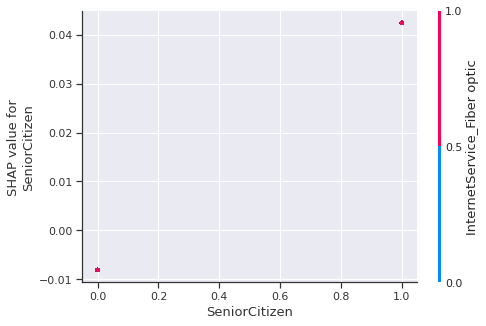

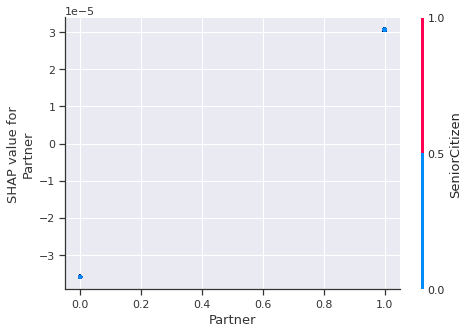

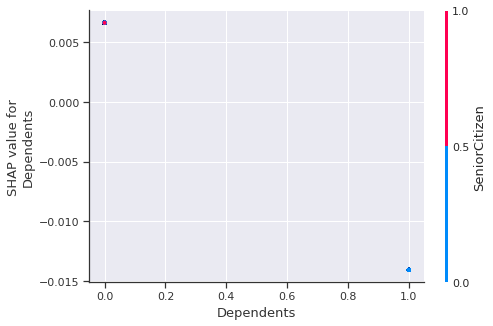

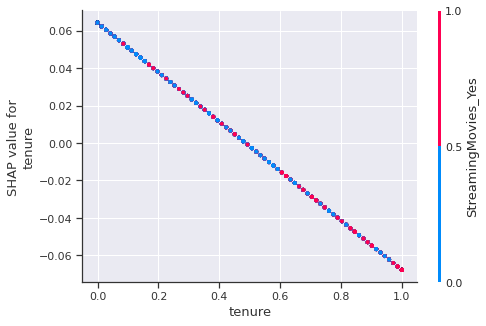

...

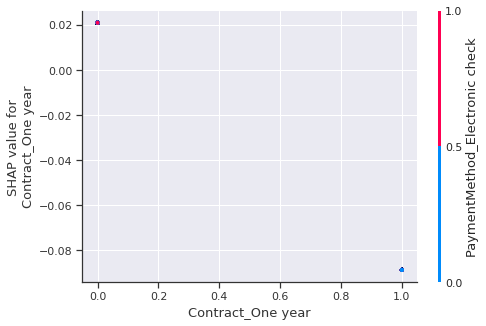

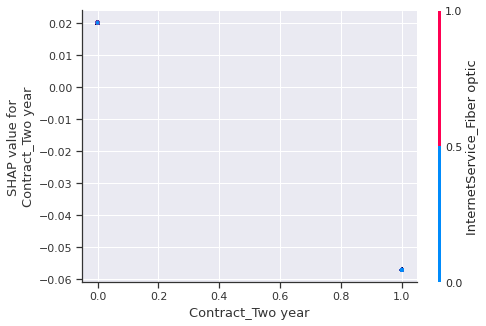

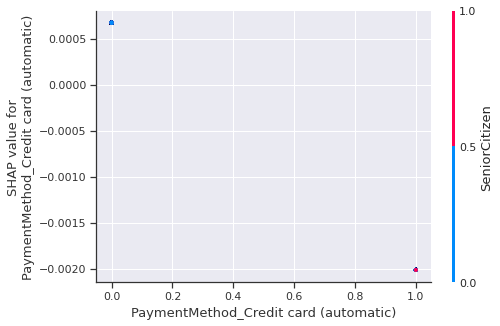

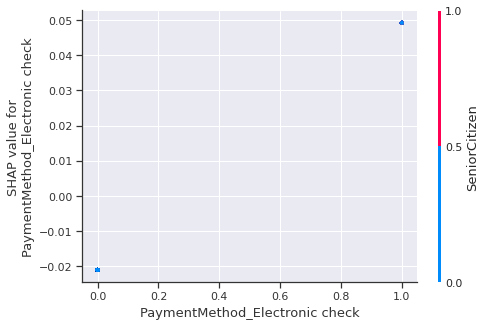

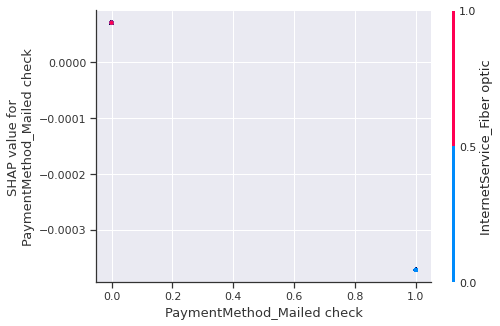

In [63]:
# SHAP partial dependence plot for linear model
for i in X_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, X_train)

## The below plot displays the distribution of importance for each variable as a standard violin plot.

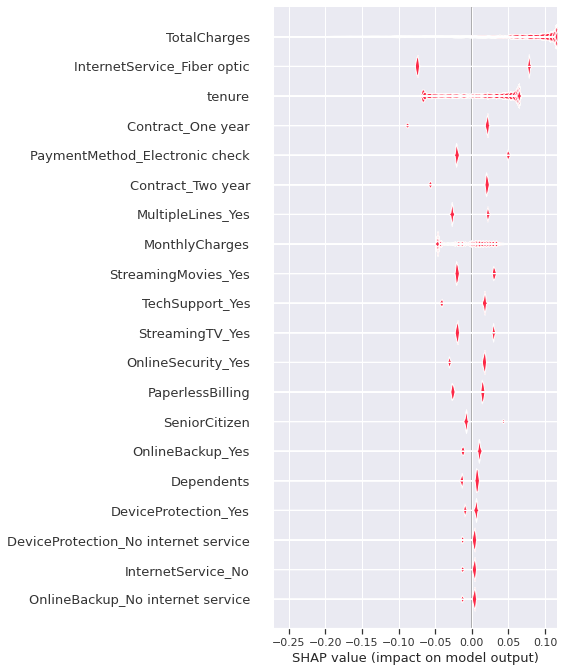

In [64]:
shap.summary_plot(linear_shap_values, plot_type="layered_violin", color='#FC2947')

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


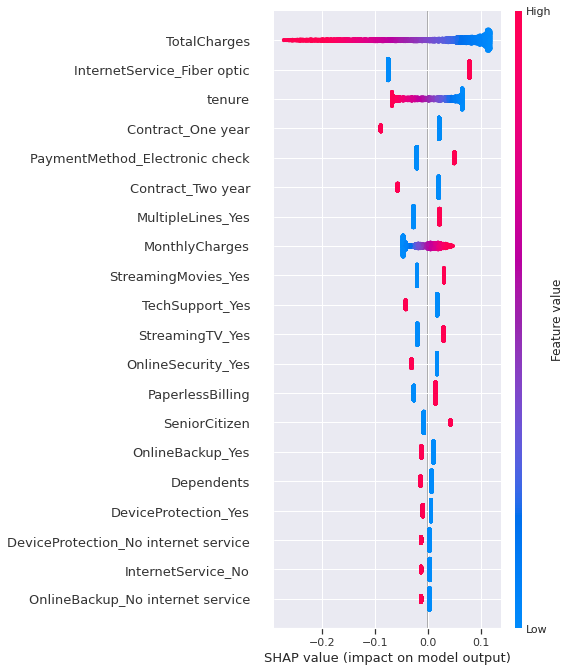

In [71]:
shap.summary_plot(shap_values = linear_shap_values,
                  features = X_train)

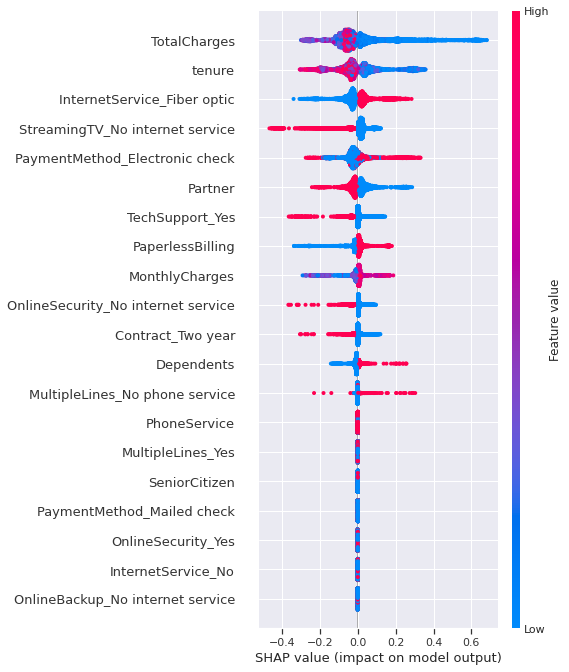

In [72]:
shap.summary_plot(shap_values = tree_shap_values,
                  features = X_train)

###References

H2O AI AutoML 

https://www.h2o.ai/products/h2o-automl/

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html

https://medium.com/analytics-vidhya/gentle-introduction-to-automl-from-h2o-ai-a42b393b4ba2

https://docs.h2o.ai/

https://towardsdatascience.com/a-deep-dive-into-h2os-automl-4b1fe51d3f3e

https://medium.com/dataman-in-ai/



###Licences:

MIT License


Copyright (c) 2023 Anusree Myneni


Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:


The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.


THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE